In [1]:
# 1-Import Libraies
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import plotly.express as px


In [2]:
# Loading the dataset
data=pd.read_csv("Womens Clothing E-Commerce Reviews.csv",index_col=False)
data

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...,...
23481,23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


In [3]:
# shows number of rows and columns in the dataset
data.shape

(23486, 11)

In [4]:
# information about dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Unnamed: 0               23486 non-null  int64 
 1   Clothing ID              23486 non-null  int64 
 2   Age                      23486 non-null  int64 
 3   Title                    19676 non-null  object
 4   Review Text              22641 non-null  object
 5   Rating                   23486 non-null  int64 
 6   Recommended IND          23486 non-null  int64 
 7   Positive Feedback Count  23486 non-null  int64 
 8   Division Name            23472 non-null  object
 9   Department Name          23472 non-null  object
 10  Class Name               23472 non-null  object
dtypes: int64(6), object(5)
memory usage: 2.0+ MB


In [5]:
# shows the data-type of each column
data.dtypes

Unnamed: 0                  int64
Clothing ID                 int64
Age                         int64
Title                      object
Review Text                object
Rating                      int64
Recommended IND             int64
Positive Feedback Count     int64
Division Name              object
Department Name            object
Class Name                 object
dtype: object

In [6]:
# columns name
data.columns

Index(['Unnamed: 0', 'Clothing ID', 'Age', 'Title', 'Review Text', 'Rating',
       'Recommended IND', 'Positive Feedback Count', 'Division Name',
       'Department Name', 'Class Name'],
      dtype='object')

In [7]:
# Checking for null values
data.isnull().sum()

Unnamed: 0                    0
Clothing ID                   0
Age                           0
Title                      3810
Review Text                 845
Rating                        0
Recommended IND               0
Positive Feedback Count       0
Division Name                14
Department Name              14
Class Name                   14
dtype: int64

In [8]:
# Dropping records having null values
data.dropna(inplace=True)

In [9]:
# Checking if null values are removed
data.isnull().sum()

Unnamed: 0                 0
Clothing ID                0
Age                        0
Title                      0
Review Text                0
Rating                     0
Recommended IND            0
Positive Feedback Count    0
Division Name              0
Department Name            0
Class Name                 0
dtype: int64

In [10]:
# Checking if any duplicate records are present
duplicate=data[data.duplicated()] 
duplicate

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name


In [11]:
# shows number of rows and columns after dropping null and duplicate values in the dataset
data.shape

(19662, 11)

In [12]:
# generate descriptive statistics
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,19662.0,11755.260655,6772.063092,2.0,5888.25,11749.5,17624.75,23485.0
Clothing ID,19662.0,921.297274,200.227528,1.0,861.00,936.0,1078.00,1205.0
Age,19662.0,43.260808,12.258122,18.0,34.00,41.0,52.00,99.0
Rating,19662.0,4.183145,1.112224,1.0,4.00,5.0,5.00,5.0
Recommended IND,19662.0,0.818177,0.385708,0.0,1.00,1.0,1.00,1.0
Positive Feedback Count,19662.0,2.652477,5.834285,0.0,0.00,1.0,3.00,122.0


In [13]:
# shows correlation variables
data.corr().T

,Unnamed: 0,Clothing ID,Age,Rating,Recommended IND,Positive Feedback Count
Unnamed: 0,1.000000,-0.001714,-0.009518,-0.005491,-0.004466,0.000405
Clothing ID,-0.001714,1.000000,0.012547,-0.013529,-0.012949,0.041300
Age,-0.009518,0.012547,1.000000,0.034910,0.035407,0.041167
Rating,-0.005491,-0.013529,0.034910,1.000000,0.793145,-0.056659
Recommended IND,-0.004466,-0.012949,0.035407,0.793145,1.000000,-0.059452
Positive Feedback Count,0.000405,0.041300,0.041167,-0.056659,-0.059452,1.000000


In [14]:
# checking dataset unique values
data.nunique()

Unnamed: 0                 19662
Clothing ID                 1095
Age                           77
Title                      13983
Review Text                19656
Rating                         5
Recommended IND                2
Positive Feedback Count       79
Division Name                  3
Department Name                6
Class Name                    20
dtype: int64

In [15]:
# object
object_data_list=[column for column in data if data[column].dtypes=='object']
object_data_list

['Title', 'Review Text', 'Division Name', 'Department Name', 'Class Name']

In [16]:
#remove unnecessary columns from data
data.drop(['Unnamed: 0'], axis = 1, inplace = True)

## Feature Selection

From now on, the DataFrame we will work with should contains two columns: **"Review Text" and "Recommended IND"**. We can do the missing value detection operations from now on.

In [17]:
data.rename(columns={'Review Text':'ReviewText','Recommended IND':'RecommendedIND'}, inplace=True)

In [18]:
data

,Clothing ID,Age,Title,ReviewText,Rating,RecommendedIND,Positive Feedback Count,Division Name,Department Name,Class Name
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
5,1080,49,Not for the very petite,"I love tracy reese dresses, but this one is no...",2,0,4,General,Dresses,Dresses
6,858,39,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5,1,1,General Petite,Tops,Knits
...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


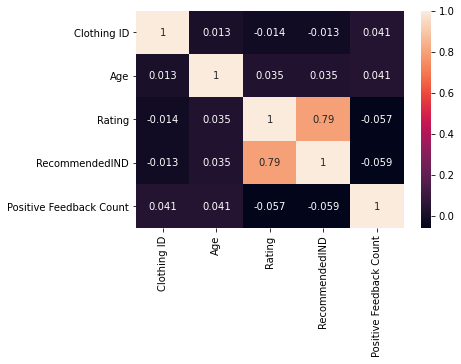

In [19]:
sns.heatmap(data.corr(), annot=True);

<AxesSubplot:>

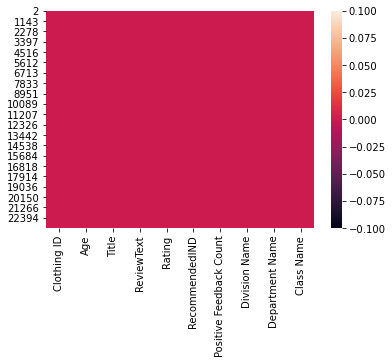

In [20]:
sns.heatmap(data.isnull())

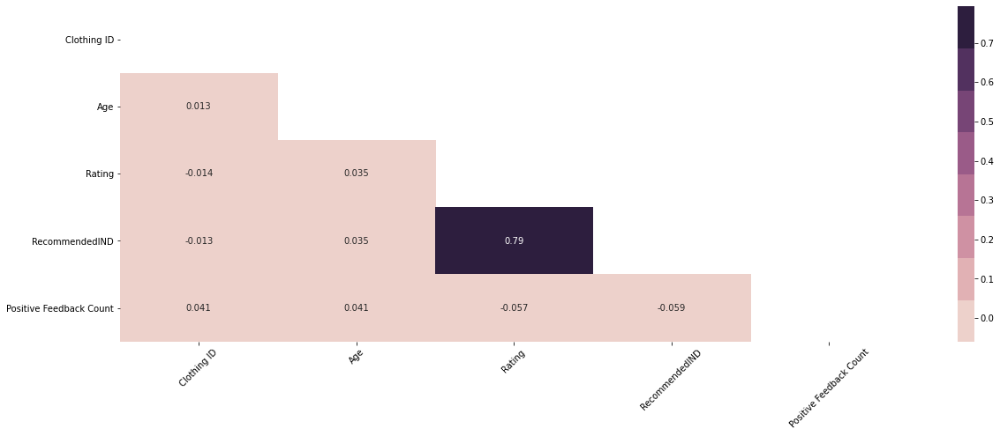

In [21]:
plt.figure(figsize=(20, 7))

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(data.corr())

# using the upper triangle matrix as mask 
sns.heatmap(data.corr(), annot=True, cmap = sns.cubehelix_palette(8), mask=matrix)

plt.xticks(rotation=45);

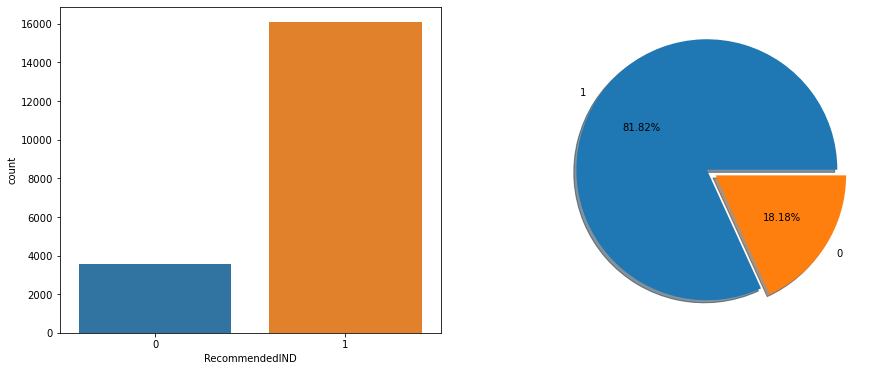

In [22]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
sns.countplot(x = data['RecommendedIND'], data = data)

plt.subplot(1, 2, 2)
plt.pie(x= data['RecommendedIND'].value_counts(), labels = ("1","0"), explode = (0, 0.08), shadow = True, autopct = '%1.2f%%')

plt.show()

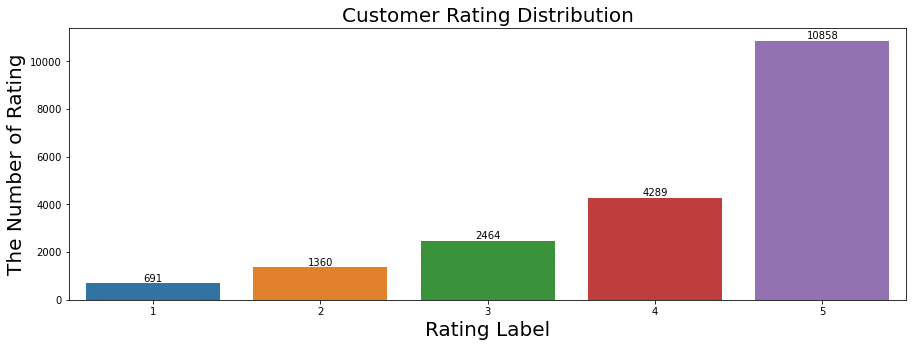

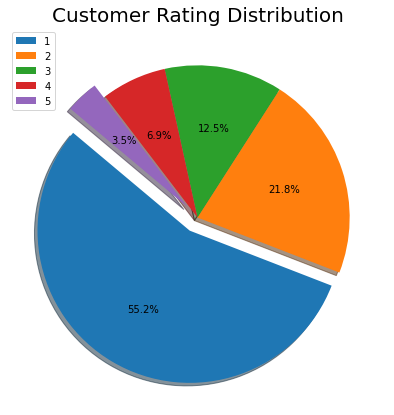

In [23]:
plt.figure(figsize=(15, 5))
sns.countplot(x = data.Rating, data = data)
plt.title('Customer Rating Distribution', fontsize=20)
plt.xlabel("Rating Label", fontsize=20)
plt.ylabel("The Number of Rating", fontsize=20)

for index,value in enumerate(data.Rating.value_counts().sort_values()):
     plt.text(index, value, f"{value}", ha="center", va="bottom", fontsize = 10);
        
plt.figure(figsize=(15, 7))
explode = [0.1, 0, 0, 0, 0.1]
plt.pie(data['Rating'].value_counts(), explode=explode, autopct='%1.1f%%', shadow=True, startangle=140)
plt.legend(labels=['1', '2', '3', '4','5'])
plt.title('Customer Rating Distribution', fontsize=20)
plt.axis('off');

As shown in the above graph, Although more than 50% of customers rated "5" for the store's products, about more than 11% of customers were not satisfies by the products and voted for "1" and "2".

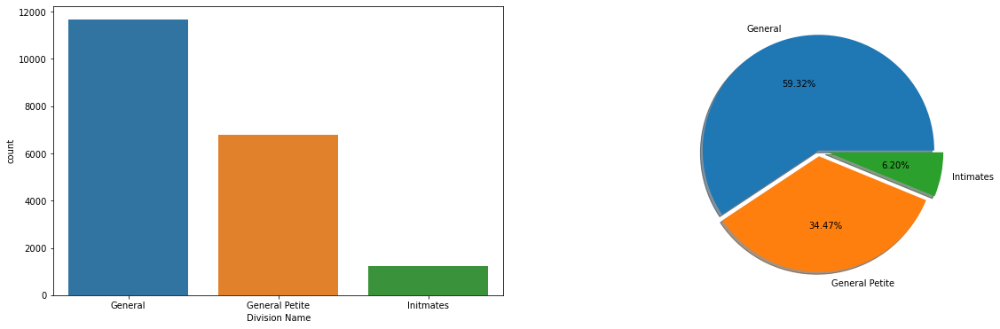

In [24]:
plt.figure(figsize = (20, 6))
plt.subplot(1, 2, 1)
sns.countplot(x = data['Division Name'], data = data)

plt.subplot(1, 2, 2)

plt.pie(x= data['Division Name'].value_counts(),labels=('General','General Petite',"Intimates") ,explode = (0, 0.05,0.08), shadow = True, autopct = '%1.2f%%')

plt.show()

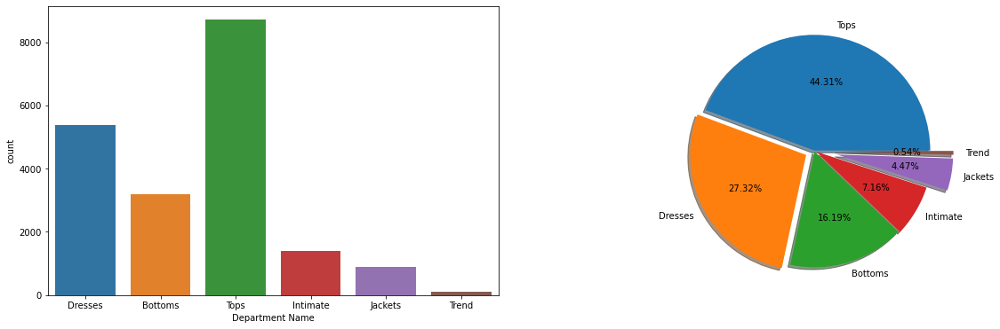

In [25]:
plt.figure(figsize = (20, 6))
plt.subplot(1, 2, 1)
sns.countplot(x = data['Department Name'], data = data)

plt.subplot(1, 2, 2)
plt.pie(x= data['Department Name'].value_counts(),labels=('Tops','Dresses',"Bottoms","Intimate","Jackets","Trend") ,explode = (0, 0.08, 0.01,0.02,0.2,0.2), shadow = True, autopct = '%1.2f%%')

plt.show()

It can be concluded that clothes in Tops section are the most available Products, while Trendy clothes are the least available ones.

C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Age Distribution')

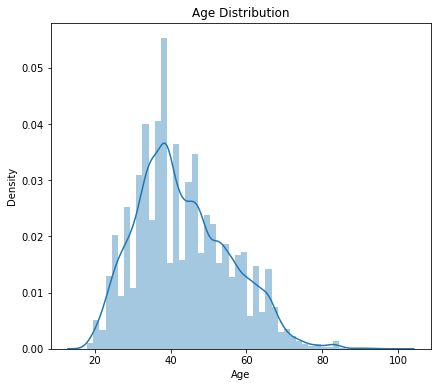

In [26]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.title = ('Age_distribution')
sns.distplot(data['Age']).set_title("Age Distribution")

The majority of customers age between 30 and 50 yeare old

In [27]:
px.histogram(data, x = data["Class Name"])

<AxesSubplot:xlabel='Age'>

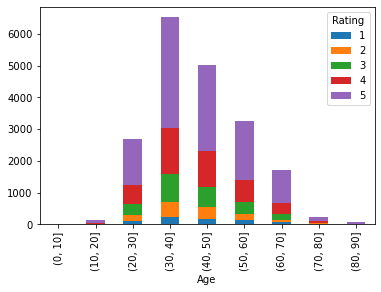

In [28]:
data.groupby(['Rating', pd.cut(data['Age'], np.arange(0,100,10))])\
       .size()\
       .unstack(0)\
       .plot.bar(stacked=True)

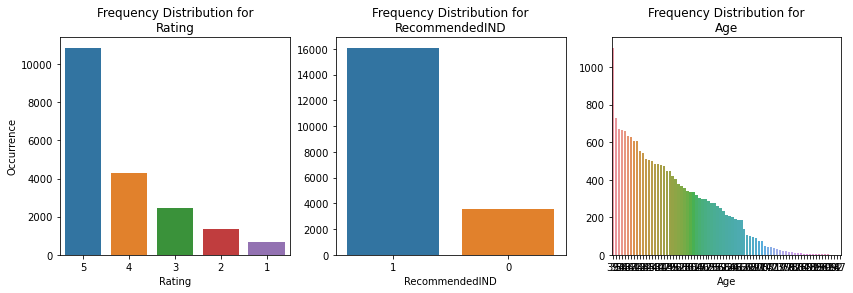

In [29]:
#cat_dtypes = [x for x,y,z in unique_count if y < 10 and x not in ["Division Name","Department Name"]]
cat_dtypes = ["Rating","RecommendedIND","Age"]
increment = 0
f, axes = plt.subplots(1,len(cat_dtypes), figsize=(14,4), sharex=False)

for i in range(len(cat_dtypes)):
    sns.countplot(x=cat_dtypes[increment], data=data,order=data[cat_dtypes[increment]].value_counts().index, ax=axes[i])
    axes[i].set_title("Frequency Distribution for\n{}".format(cat_dtypes[increment]))
    axes[i].set_ylabel("Occurrence")
    axes[i].set_xlabel("{}".format(cat_dtypes[increment]))
    increment += 1
axes[1].set_ylabel("")
axes[2].set_ylabel("")
plt.show()

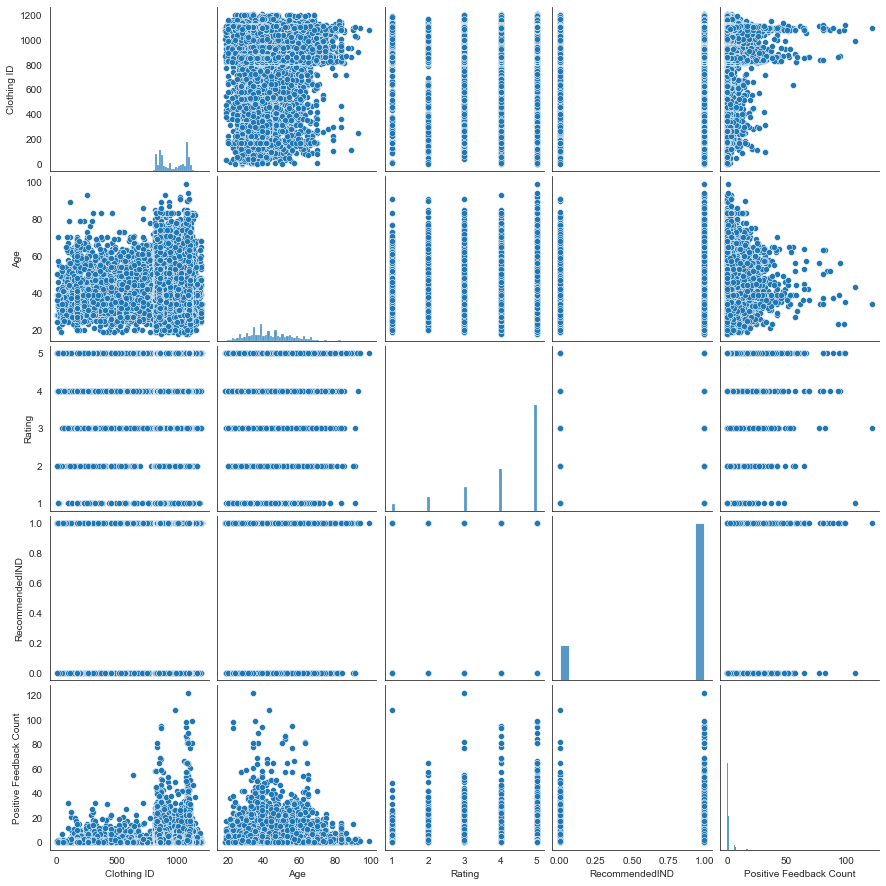

In [30]:
# Create the default pairplot
sns.set_style(style='white')
sns.pairplot(data)

In [31]:
FreqOfWords = data['ReviewText'].str.split(expand=True).stack().value_counts()
FreqOfWords_top200 = FreqOfWords[:200]

fig = px.treemap(FreqOfWords_top200, path=[FreqOfWords_top200.index], values=0, width=1000, height=600)
fig.update_layout(title_text='Top Frequent 200 Words in the Dataset (Before Cleaning)',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_traces(textinfo="label+value")
fig.show()

## Text Mining

**Tokenization, Noise Removal, Lexicon Normalization**

In [32]:
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from collections import Counter
from wordcloud import WordCloud

In [33]:
stop_words = stopwords.words('english')

In [34]:
def cleaning(data):
    
    #1. Tokenize
    text_tokens = word_tokenize(data.replace("'", "").lower()) 
        
    #2. Remove Puncs
    tokens_without_punc = [w for w in text_tokens if w.isalpha()]  
    
    #3. Removing Stopwords
    tokens_without_sw = [t for t in tokens_without_punc if t not in stop_words]
    
    #4. lemma
    text_cleaned = [WordNetLemmatizer().lemmatize(t) for t in tokens_without_sw]
        
    #joining
    return " ".join(text_cleaned)

In [35]:
data["ReviewText"] = data["ReviewText"].apply(cleaning)
data["ReviewText"]

2        high hope dress really wanted work initially o...
3        love love love jumpsuit fun flirty fabulous ev...
4        shirt flattering due adjustable front tie perf...
5        love tracy reese dress one petite foot tall us...
6        aded basket hte last mintue see would look lik...
                               ...                        
23481    happy snag dress great price easy slip flatter...
23482    reminds maternity clothes soft stretchy shiny ...
23483    fit well top see never would worked im glad ab...
23484    bought dress wedding summer cute unfortunately...
23485    dress lovely platinum feminine fit perfectly e...
Name: ReviewText, Length: 19662, dtype: object

In [36]:
" ".join(data["ReviewText"]).split()

['high',
 'hope',
 'dress',
 'really',
 'wanted',
 'work',
 'initially',
 'ordered',
 'petite',
 'small',
 'usual',
 'size',
 'found',
 'outrageously',
 'small',
 'small',
 'fact',
 'could',
 'zip',
 'reordered',
 'petite',
 'medium',
 'overall',
 'top',
 'half',
 'comfortable',
 'fit',
 'nicely',
 'bottom',
 'half',
 'tight',
 'layer',
 'several',
 'somewhat',
 'cheap',
 'net',
 'layer',
 'imo',
 'major',
 'design',
 'flaw',
 'net',
 'layer',
 'sewn',
 'directly',
 'zipper',
 'c',
 'love',
 'love',
 'love',
 'jumpsuit',
 'fun',
 'flirty',
 'fabulous',
 'every',
 'time',
 'wear',
 'get',
 'nothing',
 'great',
 'compliment',
 'shirt',
 'flattering',
 'due',
 'adjustable',
 'front',
 'tie',
 'perfect',
 'length',
 'wear',
 'legging',
 'sleeveless',
 'pair',
 'well',
 'cardigan',
 'love',
 'shirt',
 'love',
 'tracy',
 'reese',
 'dress',
 'one',
 'petite',
 'foot',
 'tall',
 'usually',
 'wear',
 'brand',
 'dress',
 'pretty',
 'package',
 'lot',
 'dress',
 'skirt',
 'long',
 'full',
 'overw

In [37]:
rare_words = pd.Series(" ".join(data["ReviewText"]).split()).value_counts()
rare_words

dress        10075
fit           9097
size          8406
love          7767
top           7358
             ...  
bagg             1
praised          1
pushup           1
kitty            1
drumstick        1
Length: 11520, dtype: int64

In [38]:
rare_words = rare_words[rare_words <= 2] 

In [39]:
rare_words.index

Index(['swatch', 'master', 'over', 'agreement', 'barley', 'corodorys',
       'impossibly', 'faith', 'colorwise', 'torture',
       ...
       'thorwback', 'inadvertently', 'chief', 'modification', 'compartment',
       'bagg', 'praised', 'pushup', 'kitty', 'drumstick'],
      dtype='object', length=6253)

In [40]:
data["ReviewText"] = data["ReviewText"].apply(lambda x: " ".join([i for i in x.split() if i not in rare_words.index]))
data["ReviewText"]

2        high hope dress really wanted work initially o...
3        love love love jumpsuit fun flirty fabulous ev...
4        shirt flattering due adjustable front tie perf...
5        love tracy reese dress one petite foot tall us...
6        basket hte last see would look like person sto...
                               ...                        
23481    happy snag dress great price easy slip flatter...
23482    reminds maternity clothes soft stretchy shiny ...
23483    fit well top see never would worked im glad ab...
23484    bought dress wedding summer cute unfortunately...
23485    dress lovely feminine fit perfectly easy wear ...
Name: ReviewText, Length: 19662, dtype: object

In [41]:
data[data["RecommendedIND"] == 0]

,Clothing ID,Age,Title,ReviewText,Rating,RecommendedIND,Positive Feedback Count,Division Name,Department Name,Class Name
2,1077,60,Some major design flaws,high hope dress really wanted work initially o...,3,0,0,General,Dresses,Dresses
5,1080,49,Not for the very petite,love tracy reese dress one petite foot tall us...,2,0,4,General,Dresses,Dresses
10,1077,53,Dress looks like it's made of cheap material,dress run small esp zipper area run ordered sp...,3,0,14,General,Dresses,Dresses
22,1077,31,Not what it looks like,first pullover styling side zipper wouldnt pur...,2,0,7,General,Dresses,Dresses
25,697,31,Falls flat,loved material didnt really look long dress pu...,3,0,0,Initmates,Intimate,Lounge
...,...,...,...,...,...,...,...,...,...,...
23447,1104,28,Fit weird,really wanted like dress encouraged positive r...,3,0,1,General Petite,Dresses,Dresses
23449,262,39,Not for me,tried color really pretty fun want pair pant l...,3,0,7,General Petite,Intimate,Lounge
23460,1078,34,Such high hopes!,purchased good price typically love maeve fabr...,3,0,0,General,Dresses,Dresses
23478,1104,32,Unflattering,surprised positive review product terrible cut...,1,0,0,General Petite,Dresses,Dresses


In [42]:
data[data["RecommendedIND"] == 1]

,Clothing ID,Age,Title,ReviewText,Rating,RecommendedIND,Positive Feedback Count,Division Name,Department Name,Class Name
3,1049,50,My favorite buy!,love love love jumpsuit fun flirty fabulous ev...,5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,shirt flattering due adjustable front tie perf...,5,1,6,General,Tops,Blouses
6,858,39,Cagrcoal shimmer fun,basket hte last see would look like person sto...,5,1,1,General Petite,Tops,Knits
7,858,39,"Shimmer, surprisingly goes with lots",ordered carbon store pick ton stuff always try...,4,1,4,General Petite,Tops,Knits
8,1077,24,Flattering,love dress usually get x run little snug bust ...,5,1,0,General,Dresses,Dresses
...,...,...,...,...,...,...,...,...,...,...
23479,1005,42,What a fun piece!,wasnt sure ordering skirt couldnt see person f...,5,1,0,General Petite,Bottoms,Skirts
23481,1104,34,Great dress for many occasions,happy snag dress great price easy slip flatter...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,Wish it was made of cotton,reminds maternity clothes soft stretchy shiny ...,3,1,0,General Petite,Tops,Knits
23484,1084,28,"Very cute dress, perfect for summer parties an...",bought dress wedding summer cute unfortunately...,3,1,2,General,Dresses,Dresses


In [43]:
" ".join(data["ReviewText"]).split()

['high',
 'hope',
 'dress',
 'really',
 'wanted',
 'work',
 'initially',
 'ordered',
 'petite',
 'small',
 'usual',
 'size',
 'found',
 'small',
 'small',
 'fact',
 'could',
 'zip',
 'reordered',
 'petite',
 'medium',
 'overall',
 'top',
 'half',
 'comfortable',
 'fit',
 'nicely',
 'bottom',
 'half',
 'tight',
 'layer',
 'several',
 'somewhat',
 'cheap',
 'net',
 'layer',
 'imo',
 'major',
 'design',
 'flaw',
 'net',
 'layer',
 'sewn',
 'directly',
 'zipper',
 'c',
 'love',
 'love',
 'love',
 'jumpsuit',
 'fun',
 'flirty',
 'fabulous',
 'every',
 'time',
 'wear',
 'get',
 'nothing',
 'great',
 'compliment',
 'shirt',
 'flattering',
 'due',
 'adjustable',
 'front',
 'tie',
 'perfect',
 'length',
 'wear',
 'legging',
 'sleeveless',
 'pair',
 'well',
 'cardigan',
 'love',
 'shirt',
 'love',
 'tracy',
 'reese',
 'dress',
 'one',
 'petite',
 'foot',
 'tall',
 'usually',
 'wear',
 'brand',
 'dress',
 'pretty',
 'package',
 'lot',
 'dress',
 'skirt',
 'long',
 'full',
 'overwhelmed',
 'small'

In [44]:
positive_words =" ".join(data[data["RecommendedIND"] == 1].ReviewText).split()
positive_words

['love',
 'love',
 'love',
 'jumpsuit',
 'fun',
 'flirty',
 'fabulous',
 'every',
 'time',
 'wear',
 'get',
 'nothing',
 'great',
 'compliment',
 'shirt',
 'flattering',
 'due',
 'adjustable',
 'front',
 'tie',
 'perfect',
 'length',
 'wear',
 'legging',
 'sleeveless',
 'pair',
 'well',
 'cardigan',
 'love',
 'shirt',
 'basket',
 'hte',
 'last',
 'see',
 'would',
 'look',
 'like',
 'person',
 'store',
 'pick',
 'went',
 'teh',
 'color',
 'pale',
 'hte',
 'color',
 'really',
 'gorgeous',
 'turn',
 'trying',
 'little',
 'baggy',
 'hte',
 'x',
 'hte',
 'size',
 'bummer',
 'petite',
 'decided',
 'though',
 'said',
 'everything',
 'pant',
 'skirt',
 'trying',
 'kept',
 'oops',
 'ordered',
 'carbon',
 'store',
 'pick',
 'ton',
 'stuff',
 'always',
 'try',
 'used',
 'top',
 'pair',
 'skirt',
 'pant',
 'everything',
 'went',
 'color',
 'really',
 'nice',
 'charcoal',
 'shimmer',
 'went',
 'well',
 'pencil',
 'skirt',
 'flare',
 'pant',
 'etc',
 'bit',
 'big',
 'sleeve',
 'long',
 'doesnt',
 'g

In [45]:
negative_words = " ".join(data[data["RecommendedIND"] == 0].ReviewText).split()
negative_words 

['high',
 'hope',
 'dress',
 'really',
 'wanted',
 'work',
 'initially',
 'ordered',
 'petite',
 'small',
 'usual',
 'size',
 'found',
 'small',
 'small',
 'fact',
 'could',
 'zip',
 'reordered',
 'petite',
 'medium',
 'overall',
 'top',
 'half',
 'comfortable',
 'fit',
 'nicely',
 'bottom',
 'half',
 'tight',
 'layer',
 'several',
 'somewhat',
 'cheap',
 'net',
 'layer',
 'imo',
 'major',
 'design',
 'flaw',
 'net',
 'layer',
 'sewn',
 'directly',
 'zipper',
 'c',
 'love',
 'tracy',
 'reese',
 'dress',
 'one',
 'petite',
 'foot',
 'tall',
 'usually',
 'wear',
 'brand',
 'dress',
 'pretty',
 'package',
 'lot',
 'dress',
 'skirt',
 'long',
 'full',
 'overwhelmed',
 'small',
 'frame',
 'stranger',
 'alteration',
 'shortening',
 'skirt',
 'would',
 'take',
 'away',
 'embellishment',
 'garment',
 'love',
 'color',
 'idea',
 'style',
 'work',
 'returned',
 'dress',
 'dress',
 'run',
 'small',
 'esp',
 'zipper',
 'area',
 'run',
 'ordered',
 'sp',
 'typically',
 'fit',
 'tight',
 'material',

In [46]:
len(" ".join(data["ReviewText"]).split())

566180

In [47]:
len(positive_words)

462113

In [48]:
len(negative_words)

104067

### Create Word Cloud (for most common words in recommended not recommended reviews separately

In [49]:
review_text = data["ReviewText"]

In [50]:
all_words = " ".join(review_text)

In [51]:
all_words[:]

'high hope dress really wanted work initially ordered petite small usual size found small small fact could zip reordered petite medium overall top half comfortable fit nicely bottom half tight layer several somewhat cheap net layer imo major design flaw net layer sewn directly zipper c love love love jumpsuit fun flirty fabulous every time wear get nothing great compliment shirt flattering due adjustable front tie perfect length wear legging sleeveless pair well cardigan love shirt love tracy reese dress one petite foot tall usually wear brand dress pretty package lot dress skirt long full overwhelmed small frame stranger alteration shortening skirt would take away embellishment garment love color idea style work returned dress basket hte last see would look like person store pick went teh color pale hte color really gorgeous turn trying little baggy hte x hte size bummer petite decided though said everything pant skirt trying kept oops ordered carbon store pick ton stuff always try us

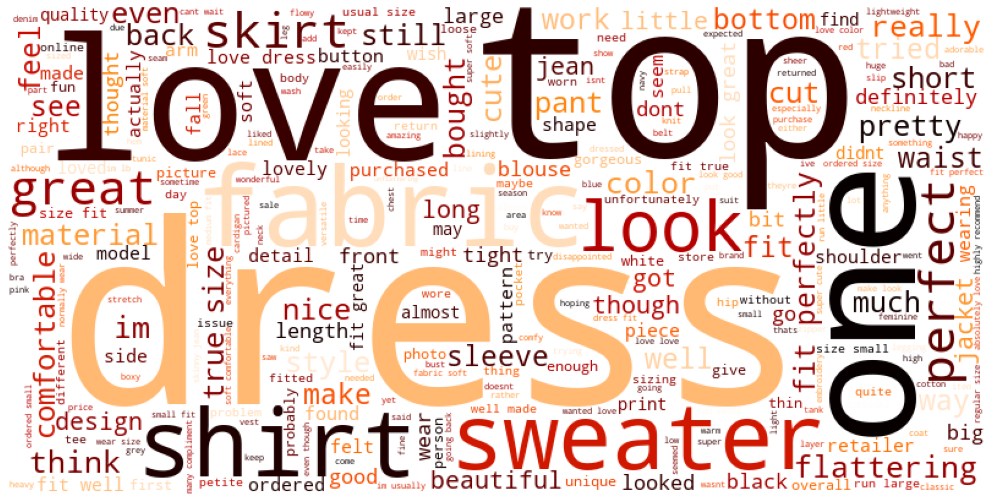

In [52]:
wordcloud = WordCloud(width = 800, height = 400,background_color="white", max_words =300, colormap='gist_heat').generate(str(all_words))

plt.figure(figsize = (20, 9))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [53]:
FreqOfWords =data["ReviewText"].str.split(expand=True).stack().value_counts()
FreqOfWords_top200 = FreqOfWords[:200]

fig = px.treemap(FreqOfWords_top200, path=[FreqOfWords_top200.index], values=0, width=1000, height=600)
fig.update_layout(title_text='Top Frequent 200 Words in the Dataset (After Cleaning)',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_traces(textinfo="label+value")
fig.show()

As you can see from the Treemap above, all of the words are unique words and there are no stopwords in this set. Most words are 'dress', 'fit' and 'size'. Due to we are dealing with the clothing review dataset, this is pretty reasonable.

### Collect Words (positive and negative separately)

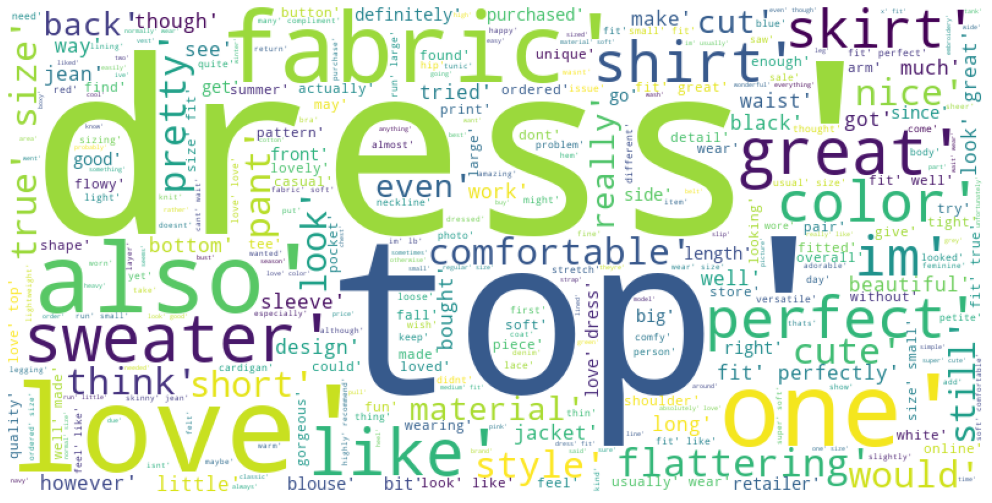

In [54]:
wordcloud = WordCloud(width = 800, height = 400, background_color = "white", max_words = 300).generate(str(positive_words))

plt.figure(figsize = (20, 9))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

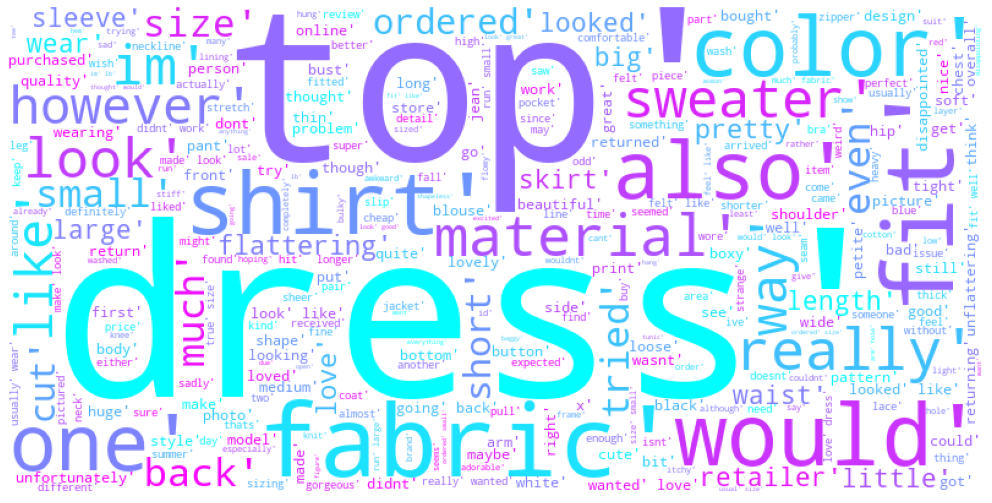

In [55]:
wordcloud = WordCloud(width = 800, height = 400,background_color="white", max_words =300, colormap='cool').generate(str(negative_words))

plt.figure(figsize = (20,9))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [56]:
# Counting words
counter_all = Counter(word_tokenize(all_words))
counter_all.most_common()

[('dress', 10075),
 ('fit', 9097),
 ('size', 8406),
 ('love', 7767),
 ('top', 7358),
 ('like', 6285),
 ('color', 6166),
 ('look', 6151),
 ('wear', 5789),
 ('im', 5324),
 ('great', 5292),
 ('would', 4472),
 ('fabric', 4376),
 ('small', 4062),
 ('really', 3512),
 ('ordered', 3429),
 ('little', 3342),
 ('one', 3337),
 ('perfect', 3330),
 ('flattering', 3078),
 ('soft', 2945),
 ('well', 2891),
 ('back', 2852),
 ('nice', 2694),
 ('comfortable', 2682),
 ('bought', 2662),
 ('cute', 2599),
 ('bit', 2594),
 ('material', 2483),
 ('beautiful', 2481),
 ('large', 2461),
 ('shirt', 2432),
 ('sweater', 2412),
 ('much', 2407),
 ('length', 2364),
 ('also', 2325),
 ('jean', 2302),
 ('work', 2284),
 ('run', 2258),
 ('petite', 2250),
 ('got', 2155),
 ('long', 2146),
 ('short', 2106),
 ('waist', 2091),
 ('medium', 1996),
 ('skirt', 1993),
 ('think', 1976),
 ('even', 1960),
 ('quality', 1959),
 ('retailer', 1948),
 ('pretty', 1945),
 ('x', 1917),
 ('tried', 1894),
 ('make', 1875),
 ('feel', 1860),
 ('store'

## Cleaning the text for visualization of polarity

In [57]:
# Removing all the punctuations from the review text
import string
string.punctuation
def remove_punctuation(text):
    no_punct=[words for words in text if words not in string.punctuation]
    words_wo_punct=''.join(no_punct)
    return words_wo_punct
data['ReviewText']=data['ReviewText'].apply(lambda x: remove_punctuation(x))
data

,Clothing ID,Age,Title,ReviewText,Rating,RecommendedIND,Positive Feedback Count,Division Name,Department Name,Class Name
2,1077,60,Some major design flaws,high hope dress really wanted work initially o...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,love love love jumpsuit fun flirty fabulous ev...,5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,shirt flattering due adjustable front tie perf...,5,1,6,General,Tops,Blouses
5,1080,49,Not for the very petite,love tracy reese dress one petite foot tall us...,2,0,4,General,Dresses,Dresses
6,858,39,Cagrcoal shimmer fun,basket hte last see would look like person sto...,5,1,1,General Petite,Tops,Knits
...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,happy snag dress great price easy slip flatter...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,Wish it was made of cotton,reminds maternity clothes soft stretchy shiny ...,3,1,0,General Petite,Tops,Knits
23483,1104,31,"Cute, but see through",fit well top see never would worked im glad ab...,3,0,1,General Petite,Dresses,Dresses
23484,1084,28,"Very cute dress, perfect for summer parties an...",bought dress wedding summer cute unfortunately...,3,1,2,General,Dresses,Dresses


In [58]:
from textblob import *

data['polarity'] = data['ReviewText'].map(lambda text: TextBlob(text).sentiment.polarity)
data['polarity']

2        0.062409
3        0.500000
4        0.458333
5        0.150000
6        0.075625
           ...   
23481    0.677778
23482    0.191667
23483    0.450000
23484    0.416667
23485    0.373333
Name: polarity, Length: 19662, dtype: float64

In [59]:
px.histogram(data, x = 'polarity',color="Rating", opacity = 0.5)

#### This plot looks right because all the polarities of "not recommended" are less than that of polarities of the "recommended".

## Reviews with positive polarity

In [60]:
example = data.loc[data.polarity == 1,['ReviewText']].sample(3).values
for i in example:
    print(i[0])

drape perfect wash well color disappoint im medium
perfect jacket shirt tee dress jacket well made go anything
perfect


## Reviews with neutral polarity

In [61]:
example = data.loc[data.polarity == 0.5,['ReviewText']].sample(3).values
for i in example:
    print(i[0])

dress really cute lightweight knit great warmer day color lovely dusty rose look like picture since knit material tend stretch go one size would form fitting length petite size perfect
top cute love get ton compliment
love pant wear time wish hadnt


## Reviews with negative polarity

In [62]:
example = data.loc[data.polarity < 0,['ReviewText']].sample(3).values
for i in example:
    print(i[0])

really like usual size fit always wear size pilcro least size two small return regretfully size lose wish previous review let know im anyone thinking ordering
shirt smelled bad received sensitive smell dye tried anyway shapeless nothing special almost buck priced
really wanted like dress big miss big big miss look way skirt attached dress photo go high side leaving short bodice sequined pattern hit right breast looked like glittery bra cup front back glittery pattern looked like bird wing back far shorter expected overall looked like desperately trying sexy angel fairy bad bad bad


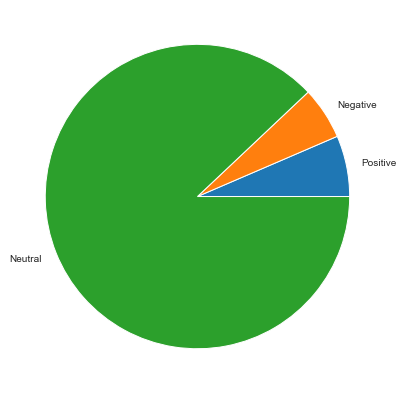

In [63]:
# Polarity Pie-Chart

negative = (len(data.loc[data.polarity < 0, ['ReviewText']].values)/len(data))*100
positive = (len(data.loc[data.polarity > 0.5, ['ReviewText']].values)/len(data))*100
neutral = len(data.loc[data.polarity >0 ,['ReviewText']].values) - len(data.loc[data.polarity >0.5 ,['ReviewText']].values)
neutral = neutral/len(data)*100
plt.figure(figsize =(10, 7)) 
plt.pie([positive,negative,neutral], labels = ['Positive','Negative','Neutral']) 
plt.show()

# Sentiment Classification with Machine Learning and Deep Learning

Before moving on to modeling, as data preprocessing steps we will need to perform ***vectorization*** and train-test split.

Machine learning algorithms most often take numeric feature vectors as input. Thus, when working with text documents, we need a way to convert each document into a numeric vector. This process is known as text vectorization. Commonly used vectorization approach that we will use here is to represent each text as a vector of word counts.

At this moment, we have our review text column as a token (which has no punctuations and stopwords). We can use Scikit-learn’s CountVectorizer to convert the text collection into a matrix of token counts. We can imagine this resulting matrix as a 2-D matrix, where each row is a unique word, and each column is a review.

After performing data preprocessing, we will build our models using following classification algorithms:

**Logistic Regression,**

**Naive Bayes,**

**Support Vector Machine,**

**Random Forest,**

**Ada Boosting**

**Deep Learning Model.**

## Train - Test Split
To run machine learning algorithms we need to convert text files into numerical feature vectors. We will use bag of words model for our analysis.

First we spliting the data into train and test sets:

In [64]:
X = data["ReviewText"].values
y = data["RecommendedIND"].map({0:1, 1:0}).values

In [65]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = 101)

### Count Vectorization

In the next step we create a numerical feature vector for each document

In [66]:
from sklearn.feature_extraction.text import CountVectorizer

In [67]:
vectorizer = CountVectorizer()

X_train_count = vectorizer.fit_transform(X_train)
X_test_count = vectorizer.transform(X_test)

In [68]:
X_train_count

<15729x5238 sparse matrix of type '<class 'numpy.int64'>'
	with 410384 stored elements in Compressed Sparse Row format>

In [69]:
X_test_count

<3933x5238 sparse matrix of type '<class 'numpy.int64'>'
	with 101560 stored elements in Compressed Sparse Row format>

In [70]:
len(X_train_count.toarray())


15729

In [71]:
X_train_count.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [72]:
len(X_test_count.toarray())

3933

In [73]:
X_test_count.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [74]:
vectorizer.get_feature_names()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



['aa',
 'ab',
 'abdomen',
 'ability',
 'able',
 'abo',
 'absolute',
 'absolutely',
 'absolutley',
 'abstract',
 'absurd',
 'abt',
 'abundance',
 'ac',
 'accent',
 'accented',
 'accentuate',
 'accentuated',
 'accentuates',
 'accentuating',
 'acceptable',
 'access',
 'accessorize',
 'accessorized',
 'accessorizing',
 'accessory',
 'accident',
 'accidental',
 'accidentally',
 'accommodate',
 'accommodates',
 'accommodating',
 'accomodate',
 'according',
 'accordingly',
 'account',
 'accurate',
 'accurately',
 'achieve',
 'across',
 'acrylic',
 'act',
 'action',
 'active',
 'activewear',
 'activity',
 'actual',
 'actuality',
 'actually',
 'ad',
 'ada',
 'add',
 'added',
 'addicted',
 'adding',
 'addition',
 'additional',
 'additionally',
 'address',
 'adequate',
 'adequately',
 'adjust',
 'adjustable',
 'adjusted',
 'adjusting',
 'adjustment',
 'admire',
 'admired',
 'admiring',
 'admit',
 'admittedly',
 'adn',
 'adorable',
 'adore',
 'adored',
 'adult',
 'advantage',
 'advertised',
 'advi

In [75]:
pd.DataFrame(X_train_count.toarray(), columns = vectorizer.get_feature_names())


,aa,ab,abdomen,ability,able,abo,absolute,absolutely,absolutley,abstract,...,yummy,zero,zigzag,zip,zipped,zipper,zippered,zipping,zone,zoom
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15724,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15725,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15726,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15727,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [76]:
X_train

array(['saw store didnt size ordered wore twice already got many compliment current flattering',
       'eye store finally got sweater bad hte petite size already sold however good thing x stil nice way wil know petite decided jsut purchase dont xx either fit hte looser comfortable side red color rich design subtle adn nto fall apart add interest otherwise typical pullover look nice j',
       'tried jacket definitely cute couple thing note wool acrylic blend already starting pill tried store also unlined thought price point high given fiber unlined given hem wonder much longevity piece quickly might start look dated',
       ...,
       'loved shirt first time washed shrunk much became unwearable returned salesperson said also bought shirt thing happened',
       'reason gave star instead way small chest anything usually always wear size dress dress beauty full size small trust gorgeous stretch need zipper said exchanged size flaw ive read review disappear sleeve better fall nicely co

### TF-IDF

In [77]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [78]:
tf_idf_vectorizer = TfidfVectorizer()

X_train_tf_idf = tf_idf_vectorizer.fit_transform(X_train)
X_test_tf_idf = tf_idf_vectorizer.transform(X_test)

In [79]:
X_train_tf_idf.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [80]:
pd.DataFrame(X_train_tf_idf.toarray(), columns = tf_idf_vectorizer.get_feature_names())

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



,aa,ab,abdomen,ability,able,abo,absolute,absolutely,absolutley,abstract,...,yummy,zero,zigzag,zip,zipped,zipper,zippered,zipping,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15724,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
15725,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
15726,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
15727,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.173865,0.0,0.0,0.0,0.0


## Modelling with Machine Learning Models

In [81]:
from sklearn.metrics import plot_confusion_matrix, confusion_matrix, classification_report, accuracy_score, f1_score, recall_score, precision_score, average_precision_score

In [82]:
def eval(model, X_train, X_test):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    
    print(confusion_matrix(y_test, y_pred))
    print("Test_Set")
    print(classification_report(y_test,y_pred))
    print("Train_Set")
    print(classification_report(y_train,y_pred_train))
    plot_confusion_matrix(model, X_test, y_test, cmap="plasma")

### Logistic Regression

**Logistic Regression With Count Vectorizor**

In [83]:
from sklearn.linear_model import LogisticRegression

logreg_count = LogisticRegression(C = 0.1, max_iter = 1000, class_weight = 'balanced', random_state = 101)
logreg_count.fit(X_train_count,y_train)

LogisticRegression(C=0.1, class_weight='balanced', max_iter=1000,
                   random_state=101)

LogReg_Count Model
------------------
[[2822  396]
 [ 120  595]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      3218
           1       0.60      0.83      0.70       715

    accuracy                           0.87      3933
   macro avg       0.78      0.85      0.81      3933
weighted avg       0.89      0.87      0.88      3933

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.89      0.93     12869
           1       0.64      0.92      0.76      2860

    accuracy                           0.89     15729
   macro avg       0.81      0.90      0.84     15729
weighted avg       0.92      0.89      0.90     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



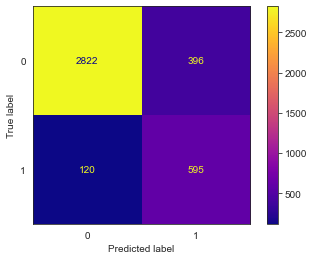

In [84]:
print("LogReg_Count Model")
print ("------------------")
eval(logreg_count, X_train_count, X_test_count)

In [85]:
import random
import pylab as pl
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



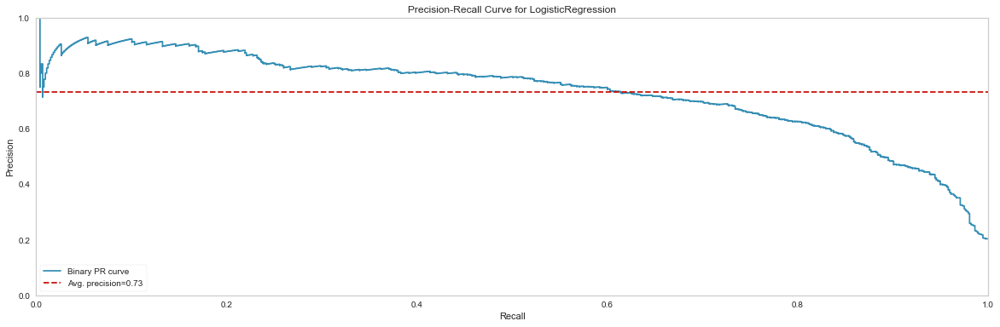

In [86]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
      LogisticRegression(C = 0.1, max_iter = 1000, class_weight= "balanced", random_state=101),
      classes = logreg_count.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();

In [87]:
y_pred = logreg_count.predict(X_test_count)
log_count_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
log_count_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
log_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [88]:
print("viz.score_       : ", viz.score_)
print("LogReg_Count_rec : ", log_count_rec)
print("LogReg_Count_f1  : ", log_count_f1)
print("LogReg_Count_AP  : ", log_AP)

viz.score_       :  0.7331333066398675
LogReg_Count_rec :  [0.8769422  0.83216783]
LogReg_Count_f1  :  [0.91623377 0.6975381 ]
LogReg_Count_AP  :  0.7331333066398675


In [89]:
LogReg_Count_AP = viz.score_
LogReg_Count_AP

0.7331333066398675

**Logistic Regression With TF-IDF**

In [90]:
logreg_tfidf = LogisticRegression(C = 1, max_iter = 1000, class_weight = "balanced", random_state = 101)
logreg_tfidf.fit(X_train_tf_idf,y_train)

LogisticRegression(C=1, class_weight='balanced', max_iter=1000,
                   random_state=101)

LogReg_TFIDF Model
------------------
[[2812  406]
 [ 109  606]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.87      0.92      3218
           1       0.60      0.85      0.70       715

    accuracy                           0.87      3933
   macro avg       0.78      0.86      0.81      3933
weighted avg       0.90      0.87      0.88      3933

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.88      0.93     12869
           1       0.64      0.93      0.76      2860

    accuracy                           0.89     15729
   macro avg       0.81      0.91      0.84     15729
weighted avg       0.92      0.89      0.90     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



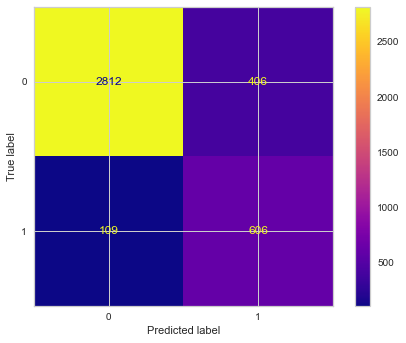

In [91]:
print("LogReg_TFIDF Model")
print("------------------")
eval(logreg_tfidf, X_train_tf_idf, X_test_tf_idf)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



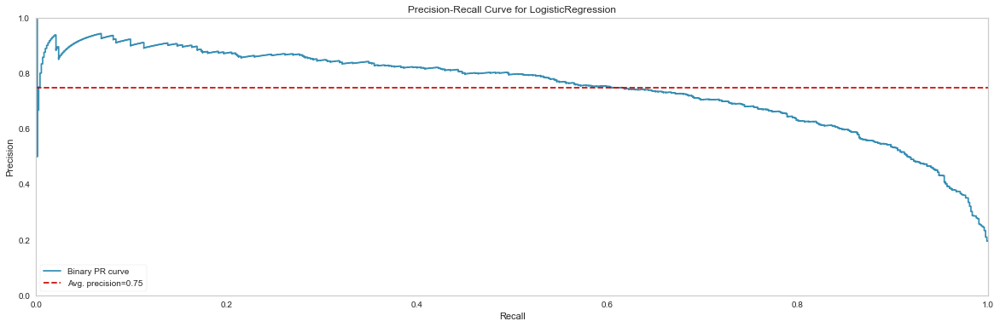

In [92]:
from yellowbrick.classifier import PrecisionRecallCurve
viz = PrecisionRecallCurve(
    LogisticRegression(C = 1, max_iter = 1000, class_weight = "balanced", random_state=101),
    classes = logreg_count.classes_,
    per_class = True,
    cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();

In [93]:
y_pred = logreg_tfidf.predict(X_test_tf_idf)
log_tf_idf_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
log_tf_idf_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
log_tf_idf_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [94]:
print("viz.score_       : ", viz.score_)
print("LogReg_TFIDF_rec : ", log_tf_idf_rec)
print("LogReg_TFIDF_f1  : ", log_tf_idf_f1)
print("LogReg_TFIDF_AP  : ", log_tf_idf_AP)

viz.score_       :  0.7489430226463161
LogReg_TFIDF_rec :  [0.87383468 0.84755245]
LogReg_TFIDF_f1  :  [0.91611012 0.70179502]
LogReg_TFIDF_AP  :  0.7489430226463161


In [95]:
LogReg_TFIDF_AP = viz.score_
LogReg_TFIDF_AP

0.7489430226463161

### Naive Bayes

**Naive Bayes With Countvectorizer MultinomialNB & BernoulliNB**

In [96]:
from sklearn.naive_bayes import MultinomialNB

In [97]:
# MultinomialNB for binary model
nbmulti_count = MultinomialNB()
nbmulti_count.fit(X_train_count,y_train)

MultinomialNB()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



NBMulti_Count Model
-------------------
[[2947  271]
 [ 179  536]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.92      0.93      3218
           1       0.66      0.75      0.70       715

    accuracy                           0.89      3933
   macro avg       0.80      0.83      0.82      3933
weighted avg       0.89      0.89      0.89      3933

Train_Set
              precision    recall  f1-score   support

           0       0.96      0.92      0.94     12869
           1       0.69      0.81      0.75      2860

    accuracy                           0.90     15729
   macro avg       0.83      0.87      0.84     15729
weighted avg       0.91      0.90      0.90     15729



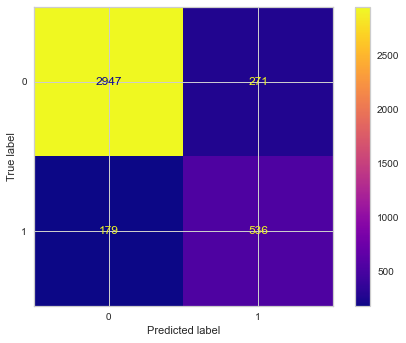

In [98]:
print("NBMulti_Count Model")
print("-------------------")
eval(nbmulti_count, X_train_count, X_test_count)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



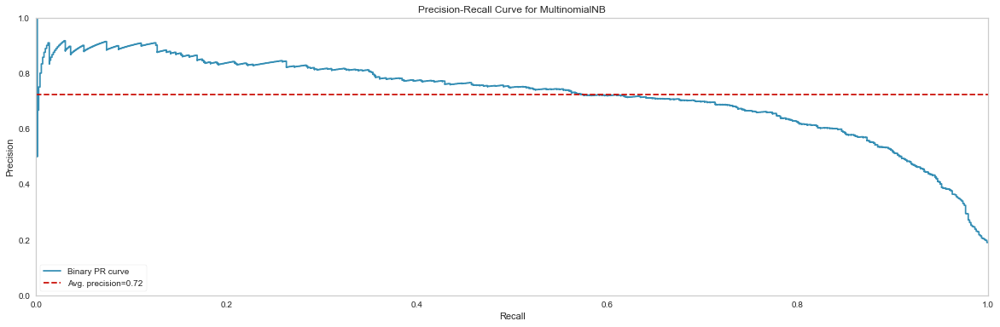

In [99]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
      MultinomialNB(),
      classes = nbmulti_count.classes_,  
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();

In [100]:
y_pred = nbmulti_count.predict(X_test_count)
nb_multi_count_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
nb_multi_count_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
nb_multi_count_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [101]:
print("viz.score_         : ", viz.score_)
print("NBMulti_Count_rec : ", nb_multi_count_rec)
print("NBMulti_Count_f1  : ", nb_multi_count_f1)
print("NBMulti_Count_AP  : ", nb_multi_count_AP)

viz.score_         :  0.7223322625769703
NBMulti_Count_rec :  [0.9157862  0.74965035]
NBMulti_Count_f1  :  [0.92906683 0.7043364 ]
NBMulti_Count_AP  :  0.7223322625769703


In [102]:
NBMulti_Count_AP = viz.score_
NBMulti_Count_AP

0.7223322625769703

**BernoulliNB for binary model**

In [103]:
from sklearn.naive_bayes import BernoulliNB

In [104]:
nbberno_count = BernoulliNB()
nbberno_count.fit(X_train_count,y_train)

BernoulliNB()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



NBBerno_Count Model
-------------------
[[2932  286]
 [ 193  522]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.91      0.92      3218
           1       0.65      0.73      0.69       715

    accuracy                           0.88      3933
   macro avg       0.79      0.82      0.80      3933
weighted avg       0.89      0.88      0.88      3933

Train_Set
              precision    recall  f1-score   support

           0       0.95      0.92      0.94     12869
           1       0.69      0.79      0.74      2860

    accuracy                           0.90     15729
   macro avg       0.82      0.86      0.84     15729
weighted avg       0.90      0.90      0.90     15729



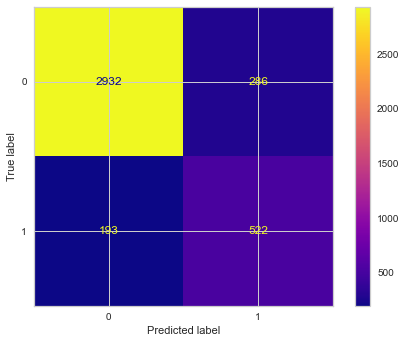

In [105]:
print("NBBerno_Count Model")
print("-------------------")
eval(nbberno_count, X_train_count, X_test_count)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



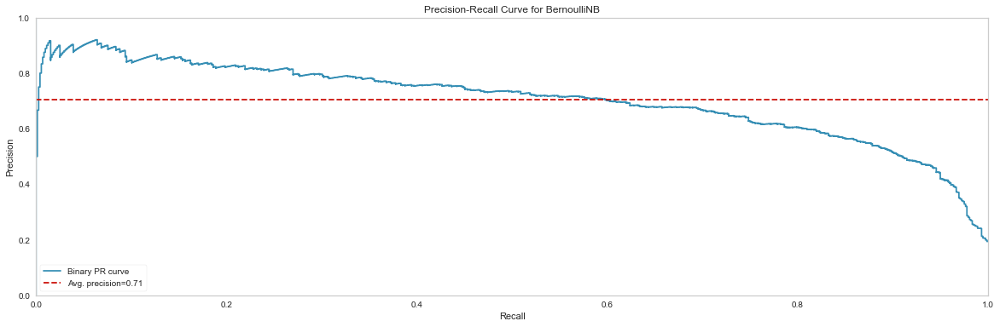

In [106]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
      BernoulliNB(),
      classes = nbberno_count.classes_,  
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();

In [107]:
y_pred = nbberno_count.predict(X_test_count)
nb_ber_count_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
nb_ber_count_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
nb_ber_count_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [108]:
print("viz.score_        : ", viz.score_)
print("NBBerno_Count_rec : ", nb_ber_count_rec)
print("NBBerno_Count_f1  : ", nb_ber_count_f1)
print("NBBerno_Count_AP  : ", nb_ber_count_AP)

viz.score_        :  0.7051834996826236
NBBerno_Count_rec :  [0.91112492 0.73006993]
NBBerno_Count_f1  :  [0.92448368 0.68548917]
NBBerno_Count_AP  :  0.7051834996826236


In [109]:
NBBerno_Count_AP = viz.score_
NBBerno_Count_AP

0.7051834996826236

**Naive Bayes With TF-IDF MultinomialNB & BernoulliNB**

In [110]:
# MultinomiaLNB
nbmulti_tfidf = MultinomialNB()
nbmulti_tfidf.fit(X_train_tf_idf,y_train)

MultinomialNB()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



NBMulti_TFIDF MODEL
-------------------
[[3205   13]
 [ 615  100]]
Test_Set
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      3218
           1       0.88      0.14      0.24       715

    accuracy                           0.84      3933
   macro avg       0.86      0.57      0.58      3933
weighted avg       0.85      0.84      0.79      3933

Train_Set
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     12869
           1       0.95      0.20      0.34      2860

    accuracy                           0.85     15729
   macro avg       0.90      0.60      0.63     15729
weighted avg       0.87      0.85      0.81     15729



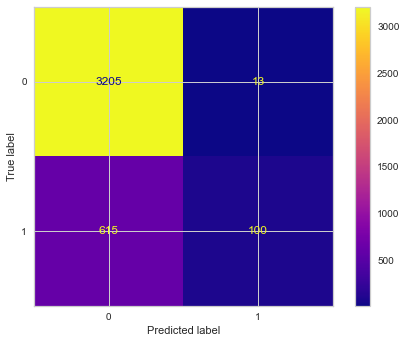

In [111]:
print("NBMulti_TFIDF MODEL")
print("-------------------")
eval(nbmulti_tfidf, X_train_tf_idf, X_test_tf_idf)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



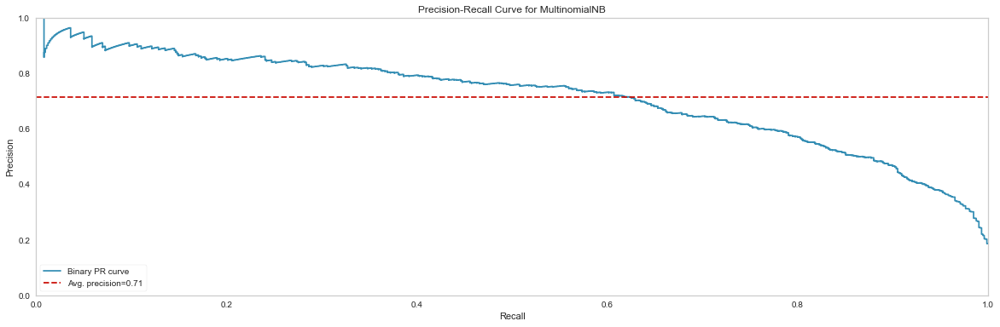

In [112]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
      MultinomialNB(),
      classes = nbmulti_tfidf.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();

In [113]:
y_pred = nbmulti_tfidf.predict(X_test_tf_idf)
nb_multi_tf_idf_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
nb_multi_tf_idf_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
nb_multi_tf_idf_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [114]:
print("viz.score_        : ", viz.score_)
print("NBMulti_TFIDF_rec : ", nb_multi_tf_idf_rec)
print("NBMulti_TFIDF_f1  : ", nb_multi_tf_idf_f1)
print("NBMulti_TFIDF_AP  : ", nb_multi_tf_idf_AP)

viz.score_        :  0.7144201010576591
NBMulti_TFIDF_rec :  [0.99596022 0.13986014]
NBMulti_TFIDF_f1  :  [0.91077011 0.24154589]
NBMulti_TFIDF_AP  :  0.7144201010576591


In [115]:
NBMulti_TFIDF_AP = viz.score_
NBMulti_TFIDF_AP

0.7144201010576591

**TF-IDF BernoulliNB**

In [116]:
nbberno_tfidf = BernoulliNB()
nbberno_tfidf.fit(X_train_tf_idf,y_train)

BernoulliNB()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



NBBerno_TFIDF MODEL
-------------------
[[2932  286]
 [ 193  522]]
Test_Set
              precision    recall  f1-score   support

           0       0.94      0.91      0.92      3218
           1       0.65      0.73      0.69       715

    accuracy                           0.88      3933
   macro avg       0.79      0.82      0.80      3933
weighted avg       0.89      0.88      0.88      3933

Train_Set
              precision    recall  f1-score   support

           0       0.95      0.92      0.94     12869
           1       0.69      0.79      0.74      2860

    accuracy                           0.90     15729
   macro avg       0.82      0.86      0.84     15729
weighted avg       0.90      0.90      0.90     15729



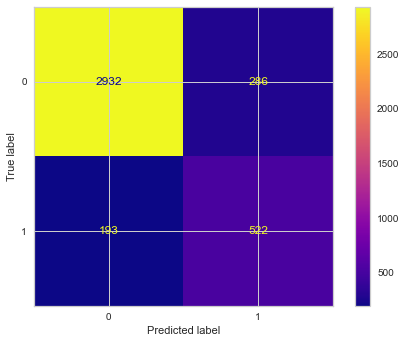

In [117]:
print("NBBerno_TFIDF MODEL")
print("-------------------")
eval(nbberno_tfidf, X_train_tf_idf, X_test_tf_idf)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



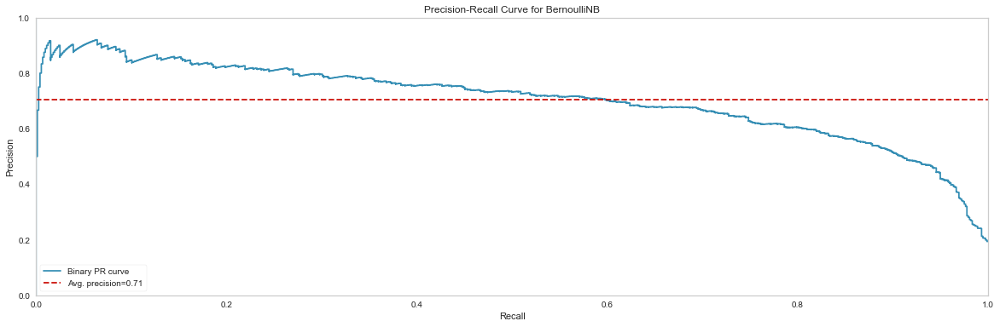

In [118]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
      BernoulliNB(),
      classes = nbberno_tfidf.classes_, 
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();

In [119]:
y_pred = nbberno_tfidf.predict(X_test_tf_idf)
nb_ber_tf_idf_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
nb_ber_tf_idf_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
nb_ber_tf_idf_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [120]:
print("viz.score_        : ", viz.score_)
print("NBBerno_TFIDF_rec : ", nb_multi_tf_idf_rec)
print("NBBerno_TFIDF_f1  : ", nb_multi_tf_idf_f1)
print("NBBerno_TFIDF_AP  : ", nb_multi_tf_idf_AP)

viz.score_        :  0.7051834996826236
NBBerno_TFIDF_rec :  [0.99596022 0.13986014]
NBBerno_TFIDF_f1  :  [0.91077011 0.24154589]
NBBerno_TFIDF_AP  :  0.7144201010576591


In [121]:
NBBerno_TFIDF_AP = viz.score_
NBBerno_TFIDF_AP

0.7051834996826236

### Support Vector Machine (SVM)

**Support Vector Machine (SVM) With Count Vectorizor**

In [122]:
from sklearn.svm import LinearSVC
svc_count = LinearSVC(C = 0.01, class_weight = "balanced", random_state = 101)  
svc_count.fit(X_train_count,y_train)

LinearSVC(C=0.01, class_weight='balanced', random_state=101)

SVC_Count Model
---------------
[[2822  396]
 [ 118  597]]
Test_Set
              precision    recall  f1-score   support

           0       0.96      0.88      0.92      3218
           1       0.60      0.83      0.70       715

    accuracy                           0.87      3933
   macro avg       0.78      0.86      0.81      3933
weighted avg       0.89      0.87      0.88      3933

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.89      0.93     12869
           1       0.65      0.93      0.76      2860

    accuracy                           0.89     15729
   macro avg       0.81      0.91      0.85     15729
weighted avg       0.92      0.89      0.90     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



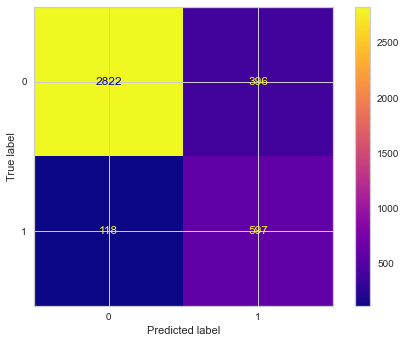

In [123]:
print("SVC_Count Model")
print("---------------")
eval(svc_count, X_train_count, X_test_count)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



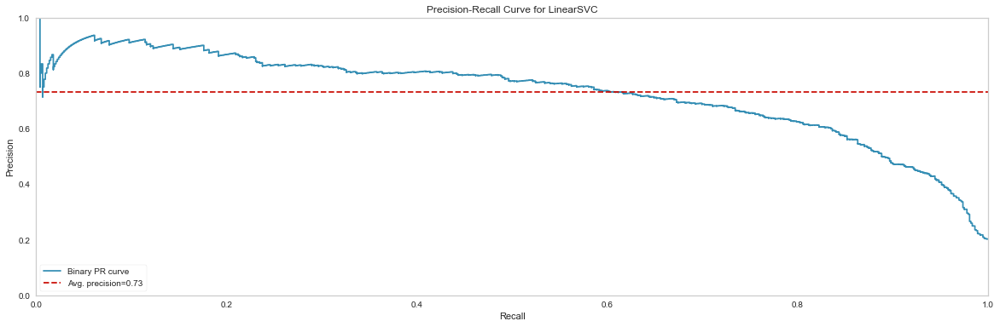

In [124]:
viz = PrecisionRecallCurve(
      LinearSVC(C = 0.01, class_weight = "balanced", random_state = 101),
      classes = svc_count.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();

In [125]:
y_pred = svc_count.predict(X_test_count)
svc_count_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
svc_count_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
svc_count_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [126]:
print("viz.score_    : ", viz.score_)
print("SVC_Count_rec : ", svc_count_rec)
print("SVC_Count_f1  : ", svc_count_f1)
print("SVC_Count_AP  : ", svc_count_AP)

viz.score_    :  0.7306804312008998
SVC_Count_rec :  [0.8769422  0.83496503]
SVC_Count_f1  :  [0.91653134 0.69906323]
SVC_Count_AP  :  0.7306804312008998


In [127]:
SVC_Count_AP = viz.score_
SVC_Count_AP

0.7306804312008998

**Support Vector Machine (SVM) With TD-IDF**

In [128]:
svc_tf_idf = LinearSVC(C = 0.01, class_weight = "balanced", random_state = 101)  
svc_tf_idf.fit(X_train_tf_idf,y_train)

LinearSVC(C=0.01, class_weight='balanced', random_state=101)

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



SVC_TFIDF Model
---------------
[[2708  510]
 [  95  620]]
Test_Set
              precision    recall  f1-score   support

           0       0.97      0.84      0.90      3218
           1       0.55      0.87      0.67       715

    accuracy                           0.85      3933
   macro avg       0.76      0.85      0.79      3933
weighted avg       0.89      0.85      0.86      3933

Train_Set
              precision    recall  f1-score   support

           0       0.97      0.85      0.90     12869
           1       0.56      0.89      0.69      2860

    accuracy                           0.85     15729
   macro avg       0.77      0.87      0.80     15729
weighted avg       0.90      0.85      0.87     15729



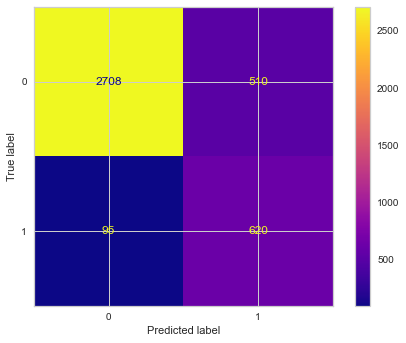

In [129]:
print("SVC_TFIDF Model")
print("---------------")
eval(svc_tf_idf, X_train_tf_idf, X_test_tf_idf)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



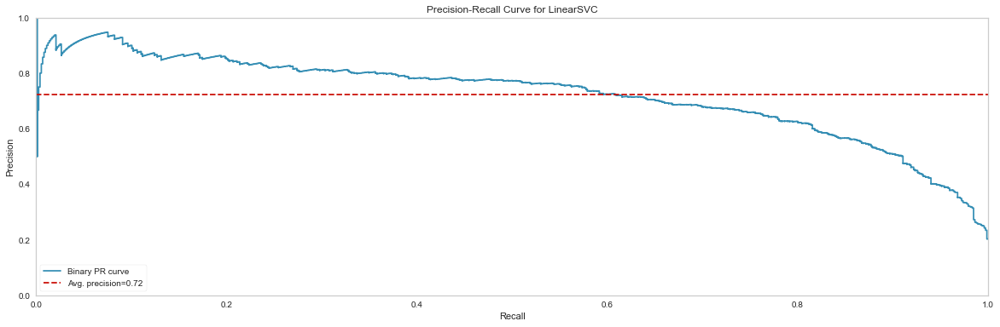

In [130]:
viz = PrecisionRecallCurve(
      LinearSVC(C = 0.01, class_weight = "balanced", random_state = 101),
      classes = svc_tf_idf.classes_,
      per_class = True,
      cmap = "Set1"
)

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();

In [131]:
y_pred = svc_tf_idf.predict(X_test_tf_idf)
svc_tf_idf_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
svc_tf_idf_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
svc_tf_idf_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [132]:
print("viz.score_     : ", viz.score_)
print("SVC_TFIDF_rec   : ", svc_tf_idf_rec)
print("SVC_TFIDF_f1   : ", svc_tf_idf_f1)
print("SVC_TFIDF_AP   : ", svc_tf_idf_AP)

viz.score_     :  0.7242432223800822
SVC_TFIDF_rec   :  [0.84151647 0.86713287]
SVC_TFIDF_f1   :  [0.89951835 0.67208672]
SVC_TFIDF_AP   :  0.7242432223800822


In [133]:
SVC_TFIDF_AP = viz.score_
SVC_TFIDF_AP

0.7242432223800822

### Random Forest

**Random Forest With Count Vectorizer**

In [134]:
from sklearn.ensemble import RandomForestClassifier

rf_count = RandomForestClassifier(n_estimators = 200, max_depth = 11, class_weight = "balanced", random_state = 101, n_jobs = -1)
rf_count.fit(X_train_count, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=11, n_estimators=200,
                       n_jobs=-1, random_state=101)

RF_Count Model
--------------
[[2745  473]
 [ 135  580]]
Test_Set
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      3218
           1       0.55      0.81      0.66       715

    accuracy                           0.85      3933
   macro avg       0.75      0.83      0.78      3933
weighted avg       0.88      0.85      0.86      3933

Train_Set
              precision    recall  f1-score   support

           0       0.97      0.88      0.92     12869
           1       0.62      0.89      0.73      2860

    accuracy                           0.88     15729
   macro avg       0.80      0.88      0.83     15729
weighted avg       0.91      0.88      0.89     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



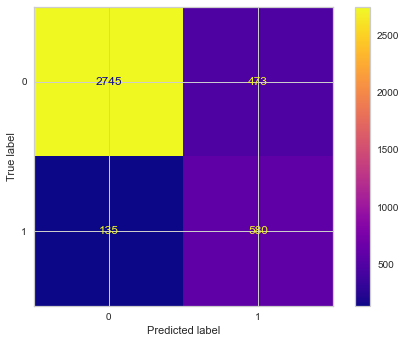

In [135]:
print("RF_Count Model")
print("--------------")
eval(rf_count, X_train_count, X_test_count)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



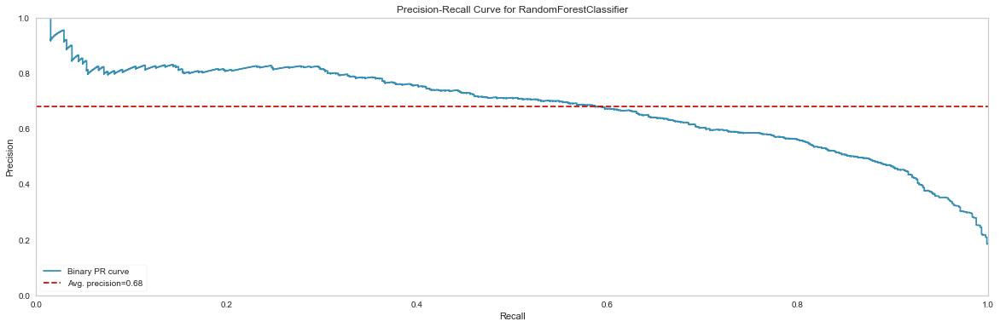

In [136]:
viz = PrecisionRecallCurve(
      RandomForestClassifier(n_estimators = 200, max_depth = 11, class_weight = "balanced", random_state = 101, n_jobs = -1),
      classes = rf_count.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize=(20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();

In [137]:
y_pred = rf_count.predict(X_test_count)
rf_count_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
rf_count_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
rf_count_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [138]:
print("viz.score_   : ", viz.score_)
print("RF_Count_rec : ", rf_count_rec)
print("RF_Count_f1  : ", rf_count_f1)
print("RF_Count_AP  : ", rf_count_AP)

viz.score_   :  0.6799646360990809
RF_Count_rec :  [0.85301429 0.81118881]
RF_Count_f1  :  [0.90029518 0.6561086 ]
RF_Count_AP  :  0.6799646360990809


In [139]:
RF_Count_AP = viz.score_
RF_Count_AP

0.6799646360990809

**Random Forest With TF-IDF**

In [140]:
rf_tf_idf = RandomForestClassifier(n_estimators = 200, max_depth = 11, class_weight = "balanced", random_state = 101, n_jobs = -1)
rf_tf_idf.fit(X_train_tf_idf, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=11, n_estimators=200,
                       n_jobs=-1, random_state=101)

RF_TFIDF Model
--------------
[[2697  521]
 [ 155  560]]
Test_Set
              precision    recall  f1-score   support

           0       0.95      0.84      0.89      3218
           1       0.52      0.78      0.62       715

    accuracy                           0.83      3933
   macro avg       0.73      0.81      0.76      3933
weighted avg       0.87      0.83      0.84      3933

Train_Set
              precision    recall  f1-score   support

           0       0.98      0.86      0.92     12869
           1       0.60      0.91      0.72      2860

    accuracy                           0.87     15729
   macro avg       0.79      0.89      0.82     15729
weighted avg       0.91      0.87      0.88     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



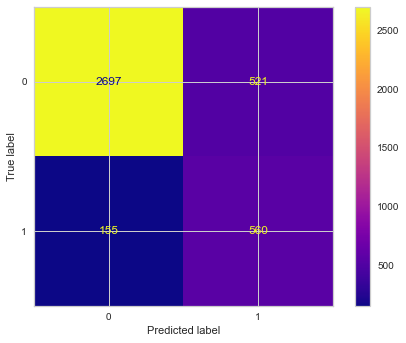

In [141]:
print("RF_TFIDF Model")
print("--------------")
eval(rf_tf_idf, X_train_tf_idf, X_test_tf_idf)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



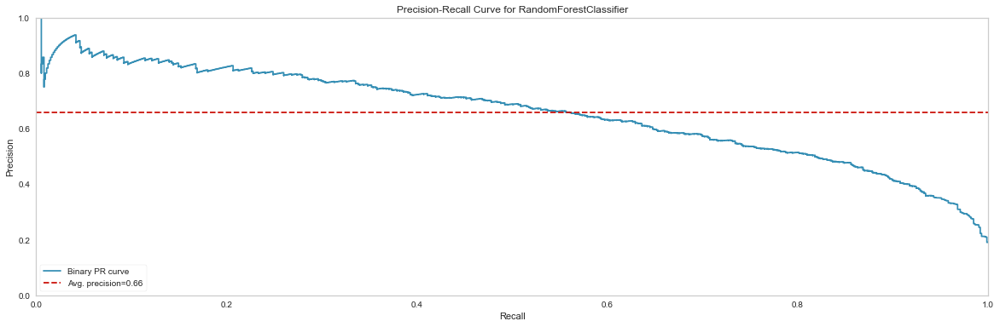

In [142]:
viz = PrecisionRecallCurve(
      RandomForestClassifier(n_estimators = 200, max_depth = 11, class_weight = "balanced", random_state = 101, n_jobs = -1),
      classes = rf_tf_idf.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize=(20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();

In [143]:
y_pred = rf_tf_idf.predict(X_test_tf_idf)
rf_tf_idf_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
rf_tf_idf_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
rf_tf_idf_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [144]:
print("viz.score_   : ", viz.score_)
print("RF_TFIDF_rec : ", rf_tf_idf_rec)
print("RF_TFIDF_f1  : ", rf_tf_idf_f1)
print("RF_TFIDF_AP  : ", rf_tf_idf_AP)

viz.score_   :  0.6584773993835086
RF_TFIDF_rec :  [0.8380982  0.78321678]
RF_TFIDF_f1  :  [0.88863262 0.62360802]
RF_TFIDF_AP  :  0.6584773993835086


In [145]:
RF_TFIDF_AP = viz.score_
RF_TFIDF_AP

0.6584773993835086

### Ada Boosting

**Ada Boosting With Count Vectorizer**

In [146]:
from sklearn.ensemble import AdaBoostClassifier

ada_count = AdaBoostClassifier(n_estimators = 500, random_state = 101)
ada_count.fit(X_train_count, y_train)

AdaBoostClassifier(n_estimators=500, random_state=101)

Ada_Count Model
---------------
[[3060  158]
 [ 317  398]]
Test_Set
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      3218
           1       0.72      0.56      0.63       715

    accuracy                           0.88      3933
   macro avg       0.81      0.75      0.78      3933
weighted avg       0.87      0.88      0.87      3933

Train_Set
              precision    recall  f1-score   support

           0       0.93      0.96      0.95     12869
           1       0.80      0.66      0.72      2860

    accuracy                           0.91     15729
   macro avg       0.86      0.81      0.83     15729
weighted avg       0.90      0.91      0.90     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



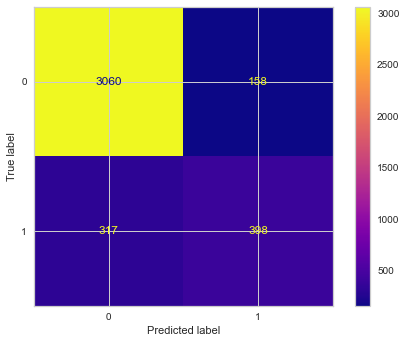

In [147]:
print("Ada_Count Model")
print("---------------")
eval(ada_count, X_train_count, X_test_count)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



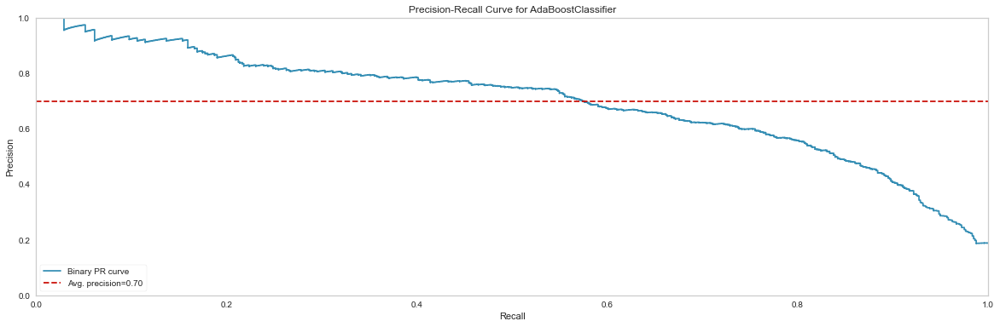

In [148]:
viz = PrecisionRecallCurve(
      AdaBoostClassifier(n_estimators = 500, random_state = 101),
      classes = ada_count.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_count,y_train)
viz.score(X_test_count, y_test)
viz.show();

In [149]:
y_pred = ada_count.predict(X_test_count)
ada_count_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
ada_count_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
ada_count_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [150]:
print("viz.score_    : ", viz.score_)
print("Ada_Count_rec : ", ada_count_rec)
print("Ada_Count_f1  : ", ada_count_f1)
print("Ada_Count_AP  : ", ada_count_AP)

viz.score_    :  0.6994454710027963
Ada_Count_rec :  [0.95090118 0.55664336]
Ada_Count_f1  :  [0.92797574 0.62627852]
Ada_Count_AP  :  0.6994454710027963


In [151]:
Ada_Count_AP = viz.score_
Ada_Count_AP

0.6994454710027963

**Ada Boosting With TF-IDF**

In [152]:
ada_tf_idf = AdaBoostClassifier(n_estimators = 500, random_state = 101)
ada_tf_idf.fit(X_train_tf_idf, y_train)

AdaBoostClassifier(n_estimators=500, random_state=101)

Ada_TFIDF Model
---------------
[[3047  171]
 [ 315  400]]
Test_Set
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      3218
           1       0.70      0.56      0.62       715

    accuracy                           0.88      3933
   macro avg       0.80      0.75      0.77      3933
weighted avg       0.87      0.88      0.87      3933

Train_Set
              precision    recall  f1-score   support

           0       0.94      0.97      0.95     12869
           1       0.83      0.71      0.76      2860

    accuracy                           0.92     15729
   macro avg       0.88      0.84      0.86     15729
weighted avg       0.92      0.92      0.92     15729



C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



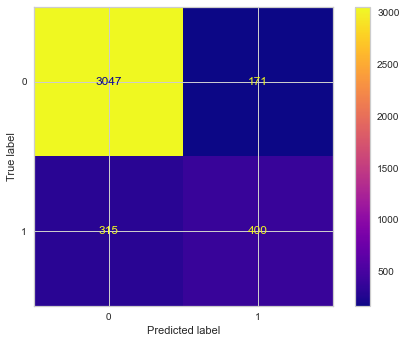

In [153]:
print("Ada_TFIDF Model")
print("---------------")
eval(ada_tf_idf, X_train_tf_idf, X_test_tf_idf)

C:\Users\HP\anaconda3\lib\site-packages\yellowbrick\classifier\prcurve.py:254: YellowbrickWarning:

micro=True is ignored;specify per_class=False to draw a PR curve after micro-averaging



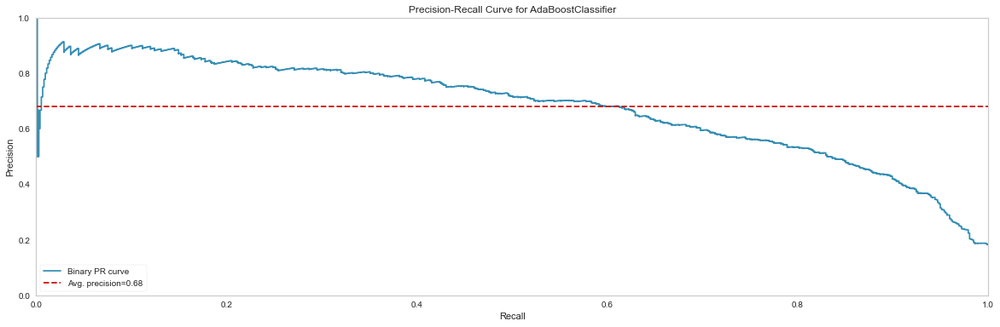

In [154]:
viz = PrecisionRecallCurve(
      AdaBoostClassifier(n_estimators = 500, random_state = 101),
      classes = ada_tf_idf.classes_,
      per_class = True,
      cmap = "Set1")

fig, ax = plt.subplots(figsize = (20, 6))
ax.set_facecolor('#FFFFFF')

viz.fit(X_train_tf_idf,y_train)
viz.score(X_test_tf_idf, y_test)
viz.show();

In [155]:
y_pred = ada_tf_idf.predict(X_test_tf_idf)
ada_tf_idf_rec = recall_score(y_test, y_pred, pos_label = 0, average = None)
ada_tf_idf_f1 = f1_score(y_test, y_pred, pos_label = 0, average = None)
ada_tf_idf_AP = viz.score_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning:

Note that pos_label (set to 0) is ignored when average != 'binary' (got None). You may use labels=[pos_label] to specify a single positive class.



In [156]:
print("viz.score_    : ", viz.score_)
print("Ada_TFIDF_rec : ", ada_tf_idf_rec)
print("Ada_TFIDF_f1  : ", ada_tf_idf_f1)
print("Ada_TFIDF_AP  : ", ada_tf_idf_AP)

viz.score_    :  0.6800170616431807
Ada_TFIDF_rec :  [0.9468614  0.55944056]
Ada_TFIDF_f1  :  [0.92613982 0.62208398]
Ada_TFIDF_AP  :  0.6800170616431807


In [157]:
Ada_TFIDF_AP = viz.score_
Ada_TFIDF_AP

0.6800170616431807

## Modelling with Deep Learning

In [158]:
data_dl = pd.read_csv("Womens Clothing E-Commerce Reviews.csv")
data_dl

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...,...
23481,23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


In [159]:
data_dl = data_dl[["Review Text","Recommended IND"]]
data_dl.head()

,Review Text,Recommended IND
0,Absolutely wonderful - silky and sexy and comf...,1
1,Love this dress! it's sooo pretty. i happene...,1
2,I had such high hopes for this dress and reall...,0
3,"I love, love, love this jumpsuit. it's fun, fl...",1
4,This shirt is very flattering to all due to th...,1


In [160]:
data_dl.rename(columns = {'Review Text':'text', 'Recommended IND':'recommend'}, inplace = True)

C:\Users\HP\anaconda3\lib\site-packages\pandas\core\frame.py:4441: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [161]:
data_dl.shape

(23486, 2)

In [162]:
data_dl.isnull().sum()

text         845
recommend      0
dtype: int64

In [163]:
data_dl = data_dl.dropna(subset = ['text'], axis = 0)
data_dl = data_dl.reset_index(drop = True)

In [164]:
data_dl.isnull().sum()

text         0
recommend    0
dtype: int64

In [165]:
data_dl.shape

(22641, 2)

In [166]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Embedding, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping

### Tokenization

In [167]:
X = data_dl['text'].values
y = data_dl['recommend'].map({0:1, 1:0}).values

In [168]:
num_words = 10000
tokenizer = Tokenizer(num_words = num_words)

In [169]:
tokenizer.fit_on_texts(X)

### Creating Word Index

In [170]:
tokenizer.word_index

{'the': 1,
 'i': 2,
 'and': 3,
 'a': 4,
 'it': 5,
 'is': 6,
 'this': 7,
 'to': 8,
 'in': 9,
 'but': 10,
 'on': 11,
 'for': 12,
 'of': 13,
 'with': 14,
 'was': 15,
 'so': 16,
 'my': 17,
 'dress': 18,
 'not': 19,
 'that': 20,
 'love': 21,
 'size': 22,
 'very': 23,
 'have': 24,
 'top': 25,
 'fit': 26,
 'are': 27,
 'like': 28,
 'be': 29,
 'as': 30,
 'me': 31,
 'wear': 32,
 "it's": 33,
 'great': 34,
 'too': 35,
 "i'm": 36,
 'or': 37,
 'am': 38,
 'just': 39,
 'you': 40,
 'would': 41,
 'they': 42,
 'up': 43,
 'at': 44,
 'fabric': 45,
 'small': 46,
 'color': 47,
 'look': 48,
 'if': 49,
 'more': 50,
 'really': 51,
 'ordered': 52,
 'little': 53,
 'perfect': 54,
 'will': 55,
 'one': 56,
 'these': 57,
 'flattering': 58,
 'well': 59,
 'an': 60,
 'soft': 61,
 'out': 62,
 'back': 63,
 'because': 64,
 'had': 65,
 'can': 66,
 '\r': 67,
 'comfortable': 68,
 'cute': 69,
 'nice': 70,
 'than': 71,
 'bought': 72,
 'beautiful': 73,
 'when': 74,
 'all': 75,
 'looks': 76,
 'bit': 77,
 'fits': 78,
 'large': 79,

In [171]:
len(tokenizer.word_index)

14847

In [172]:
len(tokenizer.word_index.keys())

14847

### Converting Tokens To Numeric

In [173]:
X_num_tokens = tokenizer.texts_to_sequences(X)

In [174]:
num_tokens = [len(tokens) for tokens in X_num_tokens]
num_tokens = np.array(num_tokens)

In [175]:
X_num_tokens

[[253, 532, 917, 3, 662, 3, 68],
 [21,
  7,
  18,
  33,
  1713,
  99,
  2,
  1322,
  8,
  221,
  5,
  9,
  4,
  106,
  3,
  36,
  314,
  2,
  131,
  1243,
  2,
  429,
  41,
  24,
  52,
  5,
  136,
  1243,
  33,
  95,
  2,
  72,
  4,
  95,
  3,
  38,
  501,
  2,
  21,
  1,
  86,
  11,
  31,
  416,
  39,
  4,
  53,
  454,
  1,
  392,
  41,
  155,
  29,
  4,
  130,
  1372,
  11,
  438,
  439,
  6,
  772,
  95],
 [2,
  65,
  312,
  178,
  1095,
  12,
  7,
  18,
  3,
  51,
  195,
  5,
  8,
  102,
  12,
  31,
  2,
  1152,
  52,
  1,
  95,
  46,
  17,
  236,
  22,
  10,
  2,
  219,
  7,
  8,
  29,
  6689,
  46,
  16,
  46,
  9,
  661,
  20,
  2,
  118,
  19,
  784,
  5,
  43,
  2,
  2147,
  5,
  9,
  95,
  97,
  82,
  15,
  39,
  637,
  250,
  1,
  25,
  656,
  15,
  68,
  3,
  26,
  258,
  10,
  1,
  175,
  656,
  65,
  4,
  23,
  148,
  272,
  475,
  3,
  527,
  718,
  489,
  4601,
  151,
  975,
  1876,
  4,
  1877,
  142,
  1589,
  15,
  1,
  4601,
  151,
  475,
  830,
  3247,
  313,
  1,


#### The Determination of Maximum Number of Tokens

In [176]:
num_tokens.max()

116

In [177]:
num_tokens.mean()

60.39287133960514

In [178]:
num_tokens.argmax()

16263

In [179]:
X[16263]

"I love maeve tops. i love the material and feel of this brand. when i saw the new tops that came out i ran to my local store to try one on. i'm usually a large in a top, once in a while an xl. they only had a large to try so i tried it in the black motif.\ni could barely get the top on. it looked like i was missing 1/2 of the top. i doubled checked the size and it was a large.\nit's a shame, the top is really cute. if you are the least bit broad or busty, go up a size or two. if you are usually a"

In [180]:
num_tokens.argmin()

820

In [181]:
X[820]

'Great style!'

#### Fixing Token Counts of All documents (Pad Sequences)

In [182]:
max_tokens = 110

In [183]:
sum(num_tokens < max_tokens) / len(num_tokens)

0.9981891259219999

In [184]:
X_pad = pad_sequences(X_num_tokens, maxlen = max_tokens)

In [185]:
X_pad.shape

(22641, 110)

## Train Set Split

In [186]:
from keras.layers import Bidirectional

In [187]:
# we have been using stratify to prevent imbalance.
X_train, X_test, y_train, y_test = train_test_split(X_pad, y, test_size = 0.2, stratify = y, random_state = 101)

## Modeling

In [188]:
model = Sequential()

In [189]:
embedding_size = 100

In [190]:
model.add(Embedding(input_dim = num_words,
                    output_dim = embedding_size,
                    input_length = max_tokens,
                    name = 'embedding_layer'))

In [191]:
model.add(Bidirectional(GRU(units = 48, return_sequences = True)))
model.add(Dropout(0.5))
model.add(Bidirectional(GRU(units = 24, return_sequences = True)))
model.add(Dropout(0.5))
model.add(Bidirectional(GRU(units = 12)))
model.add(Dense(1, activation = 'sigmoid'))

In [192]:
optimizer = Adam(lr = 0.004)

C:\Users\HP\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



In [193]:
model.compile(loss = 'binary_crossentropy',
              optimizer = optimizer,
              metrics = ["Recall"])

In [194]:
model.summary() 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_layer (Embedding)  (None, 110, 100)         1000000   
                                                                 
 bidirectional (Bidirectiona  (None, 110, 96)          43200     
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 110, 96)           0         
                                                                 
 bidirectional_1 (Bidirectio  (None, 110, 48)          17568     
 nal)                                                            
                                                                 
 dropout_1 (Dropout)         (None, 110, 48)           0         
                                                                 
 bidirectional_2 (Bidirectio  (None, 24)               4

In [195]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", 
                           verbose = 1, patience = 5, restore_best_weights = True)

In [196]:
pd.Series(y_train).value_counts(normalize = True) 

0    0.818849
1    0.181151
dtype: float64

In [197]:
weights = {0:19, 1:81}

In [198]:
model.fit(X_train, y_train, epochs = 25, batch_size = 256, class_weight = weights,
         validation_data = (X_test, y_test), callbacks = [early_stop])

Epoch 1/25
71/71 [==============================] - 94s 1s/step - loss: 15.0098 - recall: 0.7284 - val_loss: 0.3848 - val_recall: 0.8171
Epoch 2/25
71/71 [==============================] - 70s 986ms/step - loss: 9.7754 - recall: 0.8869 - val_loss: 0.4001 - val_recall: 0.8341
Epoch 3/25
71/71 [==============================] - 67s 950ms/step - loss: 7.0286 - recall: 0.9351 - val_loss: 0.3510 - val_recall: 0.7768
Epoch 4/25
71/71 [==============================] - 70s 990ms/step - loss: 5.3552 - recall: 0.9558 - val_loss: 0.5074 - val_recall: 0.8659
Epoch 5/25
71/71 [==============================] - 73s 1s/step - loss: 4.3699 - recall: 0.9680 - val_loss: 0.3816 - val_recall: 0.6805
Epoch 6/25
71/71 [==============================] - 74s 1s/step - loss: 3.5982 - recall: 0.9765 - val_loss: 0.4588 - val_recall: 0.7756
Epoch 7/25
71/71 [==============================] - 71s 1s/step - loss: 3.0211 - recall: 0.9787 - val_loss: 0.4518 - val_recall: 0.6659
Epoch 8/25
71/71 [====================

In [199]:
model.save('NLP_Sentiment_Analysis_Project')

INFO:tensorflow:Assets written to: NLP_Sentiment_Analysis_Project\assets


INFO:tensorflow:Assets written to: NLP_Sentiment_Analysis_Project\assets


**Model evaluation**

In [200]:
model_loss = pd.DataFrame(model.history.history)
model_loss.head()

,loss,recall,val_loss,val_recall
0,15.009785,0.728436,0.384834,0.817073
1,9.775367,0.886925,0.400050,0.834146
2,7.028590,0.935081,0.350953,0.776829
3,5.355159,0.955806,0.507392,0.865854
4,4.369853,0.967998,0.381647,0.680488


<AxesSubplot:>

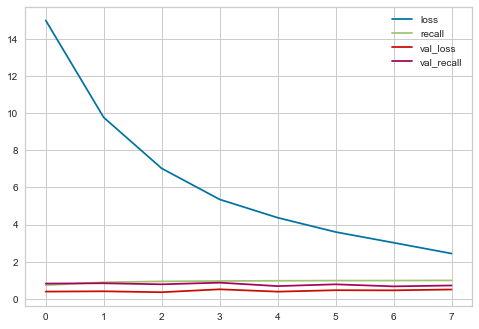

In [201]:
model_loss.plot()

In [202]:
model.evaluate(X_train, y_train)

566/566 [==============================] - 30s 47ms/step - loss: 0.1734 - recall: 0.9756


[0.17343448102474213, 0.9756171703338623]

In [203]:
model.evaluate(X_test, y_test)

142/142 [==============================] - 7s 49ms/step - loss: 0.3510 - recall: 0.7768


[0.35095301270484924, 0.7768292427062988]

In [204]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, roc_auc_score

y_train_pred = (model.predict(X_train) >= 0.5).astype("int32")

print(confusion_matrix(y_train, y_train_pred))
print("---------------------------------------------")
print(classification_report(y_train, y_train_pred))

[[13766  1065]
 [   80  3201]]
---------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.93      0.96     14831
           1       0.75      0.98      0.85      3281

    accuracy                           0.94     18112
   macro avg       0.87      0.95      0.90     18112
weighted avg       0.95      0.94      0.94     18112



In [205]:
y_pred = (model.predict(X_test) >= 0.5).astype("int32")

print(confusion_matrix(y_test, y_pred))
print("--------------------------------------")
print(classification_report(y_test, y_pred))

[[3253  456]
 [ 183  637]]
--------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.88      0.91      3709
           1       0.58      0.78      0.67       820

    accuracy                           0.86      4529
   macro avg       0.76      0.83      0.79      4529
weighted avg       0.88      0.86      0.87      4529



In [206]:
from sklearn.metrics import precision_recall_curve, average_precision_score

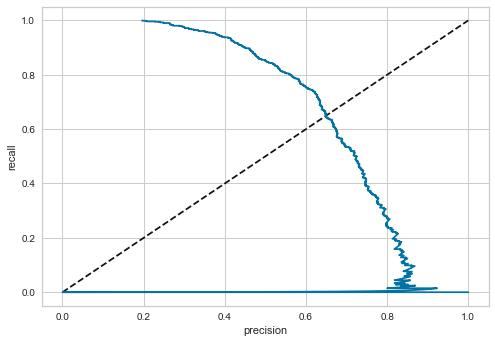

In [207]:
y_pred_proba = model.predict(X_test)
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(precision, recall)
plt.xlabel('precision')
plt.ylabel('recall')
plt.show()

In [208]:
DL_AP = average_precision_score(y_test, y_pred_proba)
DL_f1 = f1_score(y_test, y_pred)
DL_rec = recall_score(y_test, y_pred)

In [209]:
print("DL_AP   : ", DL_AP)
print("DL_f1   : ", DL_f1)
print("DL_rec  : ", DL_rec)

DL_AP   :  0.6802380349794458
DL_f1   :  0.6659696811291166
DL_rec  :  0.776829268292683


**ompare Models Average Precision Score**

In [210]:
compare = {"Model":pd.Series(["NaiveBayes(Multi)_Count", "NaiveBayes(Berno)_Count", "LogReg_Count", "SVM_Count","Random Forest_Count", "AdaBoost_Count", "NaiveBayes(Multi)_TFIDF","NaiveBayes(Berno)_TFIDF", "LogReg_TFIDF", "SVM_TFIDF", "Random Forest_TFIDF","AdaBoost_TFIDF"]),
           "Average_Precision_Score":pd.Series([NBMulti_Count_AP, NBBerno_Count_AP, LogReg_Count_AP, SVC_Count_AP, RF_Count_AP, Ada_Count_AP, NBMulti_TFIDF_AP, NBBerno_TFIDF_AP,LogReg_TFIDF_AP, SVC_TFIDF_AP, RF_TFIDF_AP, Ada_TFIDF_AP,])}
table_rmse=pd.DataFrame(compare)
table_rmse.sort_values(['Average_Precision_Score'])

,Model,Average_Precision_Score
10,Random Forest_TFIDF,0.658477
4,Random Forest_Count,0.679965
11,AdaBoost_TFIDF,0.680017
5,AdaBoost_Count,0.699445
1,NaiveBayes(Berno)_Count,0.705183
7,NaiveBayes(Berno)_TFIDF,0.705183
6,NaiveBayes(Multi)_TFIDF,0.714420
0,NaiveBayes(Multi)_Count,0.722332
9,SVM_TFIDF,0.724243
3,SVM_Count,0.730680


*When the scores are examined in the Compare section, it is seen that the scores are generally close to each other, but the Logistic Regression model stands out.*

In [211]:
compare = pd.DataFrame({"Model": ["NaiveBayes(Multi)_Count", "NaiveBayes(Berno)_Count", "LogReg_Count", "SVM_Count", 
                                  "Random Forest_Count", "AdaBoost_Count", "NaiveBayes(Multi)_TFIDF", 
                                  "NaiveBayes(Berno)_TFIDF", "LogReg_TFIDF", "SVM_TFIDF", "Random Forest_TFIDF", 
                                  "AdaBoost_TFIDF", "DL"],

                        "Average_Precision_Score": [NBMulti_Count_AP, NBBerno_Count_AP, LogReg_Count_AP, SVC_Count_AP, 
                                                    RF_Count_AP, Ada_Count_AP, NBMulti_TFIDF_AP, NBBerno_TFIDF_AP,
                                                    LogReg_TFIDF_AP, SVC_TFIDF_AP, RF_TFIDF_AP, Ada_TFIDF_AP, DL_AP]})

compare = compare.sort_values(by="Average_Precision_Score", ascending=True)
fig = px.bar(compare, x = "Average_Precision_Score", y = "Model", title = "Average_Precision_Score")
fig.show()

## Prediction

In [212]:
review1 = "I ordered this dress in 0p since i am 5ft. it fits great its not too short just above the knee."
review2 = "Love the top design, not so much the fabric. i should've read the top was 100% polyester. returning and finding a better quality top."
review3 = "Love this henely, the lace-up is cute. the shirt is comfy. so versatile. beach coverup or over jeans"
review4 = "Loved this dress online, but my small pettie stature made me looks like an orphan from the prairie."
review5 = "I tried it in the store but was not the true size so i ordered online. i wore it only once so far and got lots of compliments. very unique design."
review6 = "Nice shirt seems well made. good just not a great fit for me."
review7 = "I tried on this dress in store and was amazed by the quality and simple structure of the dress. bought it with no hesitation."
review8 = "This top has a bit of a retro flare but so adorable on. looks really cute with a pair of faded boot cut jeans."
review9 = "Great quality top. i do wish it fit me...i'm really long waisted and this top was too short. had to return"
review10 = "A serious joke. i struggled with the buttons for a good 10 minutes and gave up after the 3rd button. i'm not sure what they were thinking."

reviews = [review1, review2, review3, review4, review5, review6, review7, review8, review9, review10]

In [213]:
tokens = tokenizer.texts_to_sequences(reviews)

In [214]:
tokens_pad = pad_sequences(tokens, maxlen = max_tokens)
tokens_pad.shape

(10, 110)

In [215]:
mod_pred = model.predict(tokens_pad)
mod_pred

array([[0.07491025],
       [0.96356237],
       [0.01569423],
       [0.8604218 ],
       [0.01451042],
       [0.6350576 ],
       [0.24581572],
       [0.01666892],
       [0.95131695],
       [0.9571159 ]], dtype=float32)

In [216]:
data_pred = pd.DataFrame(mod_pred, index = reviews)
data_pred.rename(columns = {0:'Pred_Proba'}, inplace = True)

In [217]:
data_pred["Predicted_Feedbaack"] = data_pred["Pred_Proba"].apply(lambda x: "Not Recommended" if x >= 0.5 else "Recommended")
data_pred

,Pred_Proba,Predicted_Feedbaack
I ordered this dress in 0p since i am 5ft. it fits great its not too short just above the knee.,0.074910,Recommended
"Love the top design, not so much the fabric. i should've read the top was 100% polyester. returning and finding a better quality top.",0.963562,Not Recommended
"Love this henely, the lace-up is cute. the shirt is comfy. so versatile. beach coverup or over jeans",0.015694,Recommended
"Loved this dress online, but my small pettie stature made me looks like an orphan from the prairie.",0.860422,Not Recommended
I tried it in the store but was not the true size so i ordered online. i wore it only once so far and got lots of compliments. very unique design.,0.014510,Recommended
Nice shirt seems well made. good just not a great fit for me.,0.635058,Not Recommended
I tried on this dress in store and was amazed by the quality and simple structure of the dress. bought it with no hesitation.,0.245816,Recommended
This top has a bit of a retro flare but so adorable on. looks really cute with a pair of faded boot cut jeans.,0.016669,Recommended
Great quality top. i do wish it fit me...i'm really long waisted and this top was too short. had to return,0.951317,Not Recommended
A serious joke. i struggled with the buttons for a good 10 minutes and gave up after the 3rd button. i'm not sure what they were thinking.,0.957116,Not Recommended


In [222]:
# Saving the pickle file
import pickle
pickle_out=open("model_logreg_tfidf.pkl", "wb")
pickle.dump(logreg_tfidf, pickle_out)
pickle_out.close()

## Conclusion

**In this project we have used sentiment analysis to determine whether the product is recommended or not. We have built models with five different machine learning algorithms and also with deep learning algorithm and compare their performance. Thus, we have determined the algorithm that makes the most accurate emotion estimation by using the information obtained from the Review Text variable.**

**When the scores are examined in the Compare section, it is seen that the scores are generally close to each other, but the Logistic Regression model stands out.**

**Thank you.**